In [1]:
import pandas as pd
import numpy as np
import os

import geopandas as gpd

import matplotlib.pyplot as plt
#to horizontally align the plot axes and the legend axes and change the width
from mpl_toolkits.axes_grid1 import make_axes_locatable 


%matplotlib inline
#os.getcwd()

# Overview & Data

In this notebook, the goal is to introduce the user to geospatial analysis using geopandas, and to demonstrate the usefulness of geospatial by developing some insight about the City of Chicago based on this data.

The aim of this notebook is to pull in several types of data for the city of Chicago. I'll look at demographic data, crime data, transportation, business data, and rental listings in order to determine some insights about the different areas to live in the city.

Ultimately the goal is to build an app that will take these different data into consideration to help a user figure out what areas of the city they would like to live in.


Data Sources

Boundaries - Community Areas and Zip
https://data.cityofchicago.org/Facilities-Geographic-Boundaries/Boundaries-Community-Areas-current-/cauq-8yn6
https://data.cityofchicago.org/Facilities-Geographic-Boundaries/Boundaries-ZIP-Codes/gdcf-axmw

National Historical GIS (NHGIS)
https://www.nhgis.org
Block Group and tract level info for: Race, edu attainment, median hh income, and employment status. A census block group is the smallest geographic area for which the Bureau of the Census collects and tabulates decennial census data

Business Licenses
https://data.cityofchicago.org/Community-Economic-Development/Business-Licenses-Current-Active/uupf-x98q
This page will give some context about the business licenses dataset. May need some NLP to get better categorizations
about what kind of businesses these are

Crime
https://data.cityofchicago.org/Public-Safety/Crimes-2020/qzdf-xmn8

L Stops
https://data.cityofchicago.org/Transportation/CTA-System-Information-List-of-L-Stops/8pix-ypme


Rental listings were scraped from realtor.com using a script I wrote.

In [2]:
data_path = "~/Documents/Data_Science_Projects/Chicago_Tool/Data/"

cta_df = pd.read_csv(data_path + "CTA_-_System_Information_-_List_of__L__Stops.csv")
crime_df = pd.read_csv(data_path + "Crimes_-_2020.csv")
census_df = pd.read_csv(data_path + "nhgis0012_csv/nhgis0012_ds254_20215_blck_grp.csv")
biz_df = pd.read_csv(data_path + "Business_Licenses_-_Current_Active.csv")
rental_df = pd.read_csv(data_path + "Chicago_Rentals_Sample_Oct1923.csv")

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (9) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


## Maps & Combining Spatial Data
Let's focus on mapping first. Block groups, neighborhoods, points for biz licenses, and points for L stops.
Then let's layer in the spatial data.
Can probably get a census track level map that is only Chicago instead of cook county if we do this.

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  
/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  


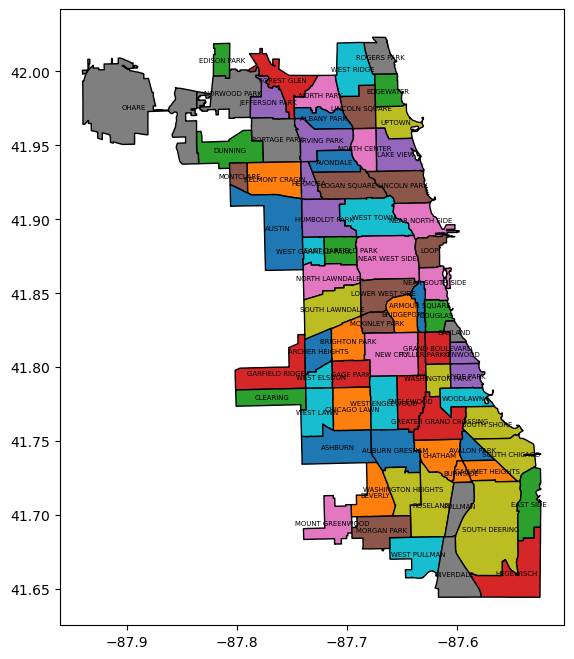

In [3]:
# shape file for Chi community areas
cmnty_sf = gpd.read_file("/Users/laurenshores/Documents/Data_Science_Projects/Exploring_Chicago_Neighborhoods/Data/Boundaries_Community_Areas/geo_export_782a78c7-402d-4a93-bb37-c4ab05c3b15b.shp")

ax = cmnty_sf.plot(column='community', figsize=[12,8], edgecolor='black')

for x, y, label in zip(cmnty_sf.geometry.centroid.x, cmnty_sf.geometry.centroid.y, cmnty_sf['community']):
    ax.text(x, y, label, fontsize=5, ha='center', va='center')
    


Note: based on warning above, I looked up projected crs's used for chicago, and this was cited as most common
* NAD83 UTM Zone 16N (EPSG 26916)

Right now, not doing any distance calculations, so a geographic crs is fine.

<AxesSubplot:>

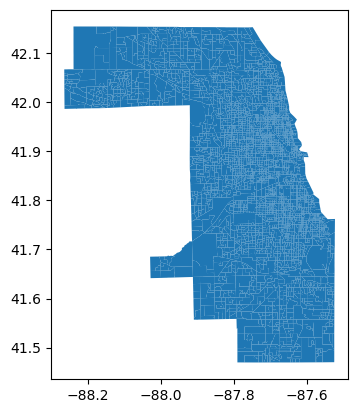

In [5]:
# shape file for Cook County census block groups
blkGrp_sf = gpd.read_file("/Users/laurenshores/Documents/Data_Science_Projects/Exploring_Chicago_Neighborhoods/Data/tigerLine_2019_IL_bg/tl_2019_17_bg.shp") 

blkGrp_sf = blkGrp_sf[(blkGrp_sf["COUNTYFP"] == "031")]

"""This shapefile contains a bunch of water in lake michigan that makes the plot awkward. 
 filter out the the largest water area """
max_water_area = blkGrp_sf["AWATER"].max()
blkGrp_sf = blkGrp_sf[blkGrp_sf["AWATER"]!= max_water_area]

blkGrp_sf.plot()

In [6]:
blkGrp_sf.head(3)

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
4,17,031,813400,1,170318134001,Block Group 1,G5030,S,415954,0,+41.8626758,-087.7629100,"POLYGON ((-87.76799 41.86555, -87.76774 41.865..."
25,17,031,820502,2,170318205022,Block Group 2,G5030,S,455769,0,+41.7518678,-087.8045848,"POLYGON ((-87.80959 41.75345, -87.80942 41.753..."
26,17,031,672000,3,170316720003,Block Group 3,G5030,S,184727,0,+41.7620710,-087.6728544,"POLYGON ((-87.67475 41.76480, -87.67450 41.764..."


In [241]:
cmnty_sf.head(3)

,area,area_num_1,area_numbe,comarea,comarea_id,community,perimeter,shape_area,shape_len,geometry
0,0.0,35,35,0.0,0.0,DOUGLAS,0.0,4.600462e+07,31027.054510,"POLYGON ((-87.60914 41.84469, -87.60915 41.844..."
1,0.0,36,36,0.0,0.0,OAKLAND,0.0,1.691396e+07,19565.506153,"POLYGON ((-87.59215 41.81693, -87.59231 41.816..."
2,0.0,37,37,0.0,0.0,FULLER PARK,0.0,1.991670e+07,25339.089750,"POLYGON ((-87.62880 41.80189, -87.62879 41.801..."


Community Records:  77
Block Group Records:  3992
Community with Block Group Records:  3992


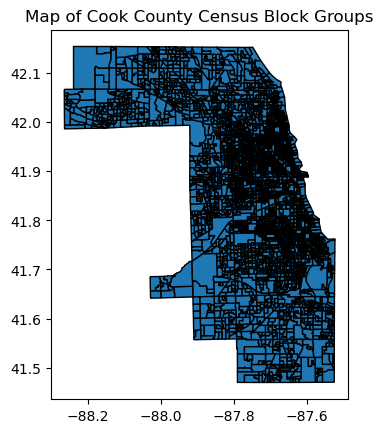

In [7]:
# Use a spatial join to add community area info to blockgroup data

# https://shapely.readthedocs.io/en/latest/manual.html#binary-predicates

# Make a copy of blkGrp geom, because when do an sjoin only the active geometry remains and we will want to get back
# down to the block group level
blkGrp_sf["blkGrpGeom"] = blkGrp_sf.geometry
cmnty_sf["cmntyGeom"] = cmnty_sf.geometry

blkGrp_sf.crs = cmnty_sf.crs

chi =gpd.sjoin( blkGrp_sf, cmnty_sf[["community","geometry", "cmntyGeom"]],  how="left", op="intersects").reset_index(drop=True)

chi.drop_duplicates(["blkGrpGeom"], inplace=True)
#chi.drop(columns="index_left",inplace=True)


chi.plot( edgecolor='black')
plt.title("Map of Cook County Census Block Groups")
print("Community Records: ", len(cmnty_sf))
print("Block Group Records: ", len( blkGrp_sf))
print("Community with Block Group Records: ", len(chi))

A brief note on sjoin predicates:

* if objects intersect, the boundary and interior of an object needs to intersect in any way with those of the other.
* If an object touches the other one, it is only necessary to have (at least) a single point of their boundaries in common but their interiors shoud NOT intersect.
https://stackoverflow.com/questions/68504942/how-do-geopandas-sjoin-predicate-within-and-intersects-differ


Text(0.5, 1.0, 'Map of Chicago Community Areas')

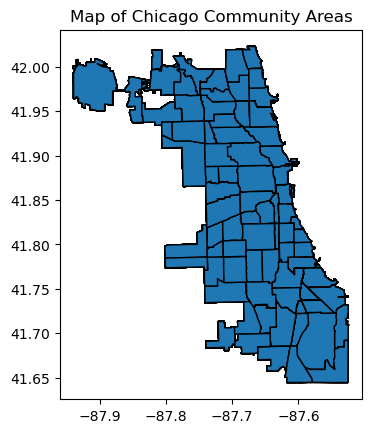

In [8]:
# seeing the above map by community, not block group
z = chi
z["geometry"] = z["cmntyGeom"]
z.plot( edgecolor='black')
plt.title("Map of Chicago Community Areas")

# CTA Data

In [41]:
cta_df.head(3)

,STOP_ID,DIRECTION_ID,STOP_NAME,STATION_NAME,STATION_DESCRIPTIVE_NAME,MAP_ID,ADA,RED,BLUE,G,BRN,P,Pexp,Y,Pnk,O,Location
0,30082,E,Cicero (Loop-bound),Cicero,Cicero (Pink Line),40420,True,False,False,False,False,False,False,False,True,False,"(41.85182, -87.745336)"
1,30151,E,Central Park (Loop-bound),Central Park,Central Park (Pink Line),40780,True,False,False,False,False,False,False,False,True,False,"(41.853839, -87.714842)"
2,30184,W,Halsted/63rd (Ashland-bound),Halsted,Halsted (Green Line),40940,True,False,False,True,False,False,False,False,False,False,"(41.778943, -87.644244)"


In [42]:
# Break location into separate lat/long columns so can make a geometry series
z = [i.replace("(","").replace(")","").split(",") for i in cta_df["Location"]]
lat = [i[0] for i in z]
long = [i[1] for i in z]
cta_df["Longitude"] = long
cta_df["Latitude"] = lat
cta_df.head(3)


,STOP_ID,DIRECTION_ID,STOP_NAME,STATION_NAME,STATION_DESCRIPTIVE_NAME,MAP_ID,ADA,RED,BLUE,G,BRN,P,Pexp,Y,Pnk,O,Location,Longitude,Latitude
0,30082,E,Cicero (Loop-bound),Cicero,Cicero (Pink Line),40420,True,False,False,False,False,False,False,False,True,False,"(41.85182, -87.745336)",-87.745336,41.85182
1,30151,E,Central Park (Loop-bound),Central Park,Central Park (Pink Line),40780,True,False,False,False,False,False,False,False,True,False,"(41.853839, -87.714842)",-87.714842,41.853839
2,30184,W,Halsted/63rd (Ashland-bound),Halsted,Halsted (Green Line),40940,True,False,False,True,False,False,False,False,False,False,"(41.778943, -87.644244)",-87.644244,41.778943


In [43]:
# Make an "L" geopandas frame and convert lat long to geometry
cta_df = gpd.GeoDataFrame(
    cta_df, 
    geometry=gpd.points_from_xy( cta_df["Longitude"], cta_df["Latitude"])#, crs="EPSG:4269"
)

cta_df.drop(columns=["Location","Longitude", "Latitude"], inplace=True)

cta_df["ctaGeom"] = cta_df.geometry

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/geopandas/array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


In [44]:
# It may be more helpful to see how many lines run through a station rather than listing out which lines and their direction
# Want to count how many train lines run through each L station /geography 

# make long, where each distinct geometry/MAP_ID is a station

# ADA is an indicator of accessibility, not a train line, so drop it
# Note that I left in purple express line, which could affect results/cnts. can think about taking it out later
z = cta_df.iloc[:,5:16].drop(columns=["ADA"])
z =pd.melt(z, id_vars="MAP_ID").drop_duplicates()

alt_cta = pd.DataFrame(z.groupby("MAP_ID")["value"].sum()).rename(columns= {"value":"cta_L_cnt"}).reset_index().merge(
cta_df[["MAP_ID","geometry", "ctaGeom"]].drop_duplicates(), how="inner")
alt_cta = gpd.GeoDataFrame(alt_cta, crs= "EPSG:4326")

In [45]:
print(len(alt_cta))
alt_cta.head()

144


,MAP_ID,cta_L_cnt,geometry,ctaGeom
0,40010,1,POINT (-87.77681 41.87085),POINT (-87.77681 41.87085)
1,40020,1,POINT (-87.80318 41.88685),POINT (-87.80318 41.88685)
2,40030,1,POINT (-87.72540 41.88541),POINT (-87.72540 41.88541)
3,40040,4,POINT (-87.63374 41.87872),POINT (-87.63374 41.87872)
4,40050,2,POINT (-87.68354 42.04771),POINT (-87.68354 42.04771)


Text(0.5, 1.0, "CTA 'L' Stations")

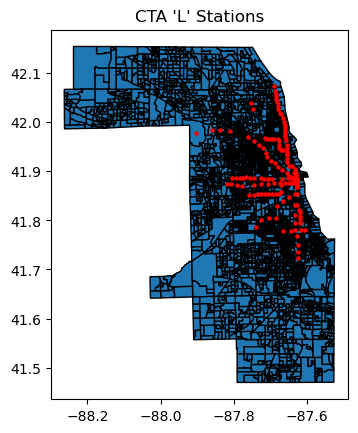

In [46]:
f, ax = plt.subplots()
#chi["geometry"] = chi["cmntyGeom"] #blkGrpGeom
chi["geometry"].plot(ax=ax,  edgecolor='black')
alt_cta.plot(ax=ax, color='red', markersize=5)
plt.title("CTA 'L' Stations")

In [47]:
# Make sure they're using the same projection reference
alt_cta.crs = chi.crs

chi["geometry"] = chi["blkGrpGeom"]
# join the points to chi df blk group polygons
cta_blk = gpd.sjoin(chi[["geometry","blkGrpGeom"]], alt_cta, how="right",  op="intersects").reset_index(drop=True)

cta_blk.drop(columns=["index_left"], inplace=True)

# sum up number of L stations in relevant block groups 129

cta_blk["blkGrpGeom"] = cta_blk["blkGrpGeom"].astype("str")

cta_blk = cta_blk.groupby("blkGrpGeom")["cta_L_cnt"].sum().reset_index()

cta_blk.dtypes
cta_blk['geometry'] = gpd.GeoSeries.from_wkt(cta_blk["blkGrpGeom"])
cta_blk = gpd.GeoDataFrame(cta_blk, geometry='geometry').drop(columns="blkGrpGeom")

cta_blk["geometry_str"] = cta_blk["geometry"].astype("str")
cta_blk.drop(columns=["geometry"], inplace=True)

print(len(cta_blk))
cta_blk.head()

129


,cta_L_cnt,geometry_str
0,1,"POLYGON ((-87.60593 41.78041, -87.605673 41.78..."
1,1,"POLYGON ((-87.615622 41.78023899999999, -87.61..."
2,1,"POLYGON ((-87.62140699999999 41.816564, -87.62..."
3,1,"POLYGON ((-87.621602 41.823775, -87.62136 41.8..."
4,1,"POLYGON ((-87.62431699999999 41.803796, -87.62..."


# Business Licenses Data

In [9]:
biz_df["BUSINESS ACTIVITY"].value_counts().head(15)

Retail Sales of Perishable Foods                          4648
Consumption of Liquor on Premises                         2763
Preparation of Food and Dining on Premise With Seating    2184
Sale of Food Prepared Onsite With Dining Area             1400
Retail Sales of General Merchandise                       1269
Administrative Commercial Office                          1200
Hair Services                                             1047
Retail Sale of Tobacco                                     959
Miscellaneous Commercial Services                          956
Retail Sales of Packaged Liquor                            853
Sale of Food Prepared Onsite Without Dining Area           837
Retail Sales of Clothing / Accessories / Shoes             828
Debt Collecting - Administrative Commercial Office         824
Tavern - Consumption of Liquor on Premise                  800
Home Repair Services                                       786
Name: BUSINESS ACTIVITY, dtype: int64

In [10]:
# count missing values per column
missing_col = [biz_df[i].isna().sum() for i in biz_df.columns]
#census_df.isna().sum( axis=0)

missing_perc = [i/len(biz_df) for i in missing_col]
missing_perc_df = pd.DataFrame({"col_name": biz_df.columns, "prop_missing": missing_perc}).sort_values(by=['prop_missing'], ascending=False)

missing_perc_df.head(10)

,col_name,prop_missing
29,LICENSE STATUS CHANGE DATE,1.000000
20,APPLICATION CREATED DATE,0.774989
30,SSA,0.738543
11,PRECINCT,0.291426
13,POLICE DISTRICT,0.283433
33,LOCATION,0.083375
32,LONGITUDE,0.083375
31,LATITUDE,0.083375
12,WARD PRECINCT,0.076970
10,WARD,0.076970


In [11]:
#biz_df#.iloc[:,5:].head(3)
biz_df[["DOING BUSINESS AS NAME","BUSINESS ACTIVITY"]]

# need a way to categorize the businesses more succinctly. Don't really want more than 10 categories
# ultimately just want a dataframe with geometry  and business type. 

# can include the name and legal name as that may hold some insights about corporate ownership

,DOING BUSINESS AS NAME,BUSINESS ACTIVITY
0,CRYSTAL BALLROOM/PLAZA BALLROOM,Sale of Liquor Outdoors on Private Property
1,STETSON'S,Retail Sales of Perishable Foods
2,STATE AMUSEMENT,"Distribution, Placing, Leasing or Sales of Aut..."
3,TTX COMPANY,Miscellaneous Commercial Services
4,Driftwood,Tavern - Consumption of Liquor on Premise
...,...,...
55419,LA LUNA BAKERY,Retail Sales of Perishable Foods
55420,Warlord,Preparation of Food and Dining on Premise With...
55421,GAFFA FASHION,Online Sales (Home Based Business)
55422,"M. GELLER, LIMITED","Wholesale Jewelry, Watches and Accessories"


### Creating My Own Business Categories

In [12]:
import re


def cleanup_fun(mytext):
    
    if type(mytext) != str:
        mytext = "Missing"
        
    # text to lowercase
    txt= mytext.lower()
    # alphanumeric characters only
    txt = re.sub(r'\W+', ' ', txt)
    # get rid of numeric values
    txt = ''.join([i for i in txt if not i.isdigit()])
    # eliminate extra white space
    txt=" ".join(txt.split())
    # eliminate words/tokens with less than two characters
    txt =[i for i in txt.split() if len(i)>=2]
    # get rid of certain words
    delete_words = ["the", "and", "for", "more", "with", "number", "com", "inc", "www"]
    txt = [i for i in txt if i not in delete_words]
    # keep only unique tokens in the list
    uni_txt = []
    [uni_txt.append(x) for x in txt if x not in uni_txt]
    txt =[i for i in txt if len(i)>2]
    return txt

In [13]:
# need a way to categorize the businesses more succinctly. Don't really want more than 10 categories
# ultimately just want a dataframe with geometry  and business type. 

# can include the name and legal name as that may hold some insights about corporate ownership
biz_df["business_text"] = biz_df["DOING BUSINESS AS NAME"] + " " + biz_df["BUSINESS ACTIVITY"]
df1=biz_df["business_text"].apply(lambda x: cleanup_fun(x))
df1

0        [crystal, ballroom, plaza, ballroom, sale, liq...
1              [stetson, retail, sales, perishable, foods]
2        [state, amusement, distribution, placing, leas...
3        [ttx, company, miscellaneous, commercial, serv...
4        [driftwood, tavern, consumption, liquor, premise]
                               ...                        
55419     [luna, bakery, retail, sales, perishable, foods]
55420    [warlord, preparation, food, dining, premise, ...
55421    [gaffa, fashion, online, sales, home, based, b...
55422    [geller, limited, wholesale, jewelry, watches,...
55423    [mother, touch, day, care, supervision, care, ...
Name: business_text, Length: 55424, dtype: object

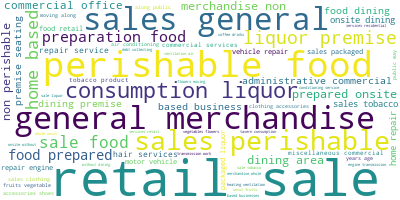

In [15]:
from wordcloud import WordCloud
#text needs to be in one big string to do ngrams or wordcloud
bigstring = " ".join([" ".join(i) for i in df1 ])

# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')
# Generate a word cloud
wordcloud.generate(bigstring)
# Visualize the word cloud
wordcloud.to_image()

In [16]:
from nltk.util import ngrams
 
# Function to generate n-grams from sentences.
def extract_ngrams(data, num):
    n_grams = ngrams(nltk.word_tokenize(data), num)
    return [ ' '.join(grams) for grams in n_grams]

In [17]:
import nltk 
bgrams = extract_ngrams(bigstring,2)
freqBgrams = nltk.FreqDist(bgrams)
topBgrams = freqBgrams.most_common(50)
topBgrams

[('retail sales', 19016),
 ('general merchandise', 7225),
 ('sales general', 6954),
 ('perishable foods', 5924),
 ('sales perishable', 5864),
 ('consumption liquor', 3690),
 ('home based', 3243),
 ('sale food', 2947),
 ('liquor premises', 2883),
 ('preparation food', 2857),
 ('food prepared', 2835),
 ('prepared onsite', 2835),
 ('dining area', 2824),
 ('non perishable', 2815),
 ('perishable food', 2815),
 ('merchandise non', 2804),
 ('commercial office', 2799),
 ('administrative commercial', 2558),
 ('based business', 2449),
 ('food dining', 2407),
 ('dining premise', 2407),
 ('premise seating', 2407),
 ('sales tobacco', 1865),
 ('onsite dining', 1801),
 ('home repair', 1692),
 ('repair services', 1687),
 ('hair services', 1588),
 ('motor vehicle', 1496),
 ('repair engine', 1487),
 ('vehicle repair', 1486),
 ('food retail', 1483),
 ('sales packaged', 1437),
 ('packaged liquor', 1409),
 ('tobacco products', 1389),
 ('commercial services', 1320),
 ('miscellaneous commercial', 1316),
 ('c

In [18]:
#pd.options.display.max_rows = 4000


In [19]:
# lists to strings
biz_str_lst = [" ".join(i) for i in df1]


new_biz_cats = []

def cat_fun(biz_str, new_cat_lst):
    # maybe just make some broad categories: dining, food retail, liquor retail, general merch, check cashing, other
    # based on some key words. search the string for keywords from a list for each category
    
    food_mart = [ "bakery", "grocery", "packaged", "non perishable", "perishable" ] #"perishable could be restaurant or retail",
    dining_bar = ["dining", "liquor premises", "seating", "tavern", "restaurant", "food prepared", "cafe"] #includes fast food
    retail = ["general merchandise", "clothing"]
    beauty = ["hair", "nails", "braiding", "beauty", "skin","waxing", "barbershop"]
    repair = ["repair"]
    entertainment = ["theater", "arcade"]

    
    # check if any items from list is in the description strings
    if any(item in biz_str for item in entertainment):
        new_cat_lst.append("entertainment")
    elif any(item in biz_str for item in dining_bar):
        new_cat_lst.append("restaurant_bar_cafe")
    elif any(item in biz_str for item in food_mart):
        new_cat_lst.append("food")
    elif any(item in biz_str for item in retail):
        new_cat_lst.append("retail_gm")
    elif any(item in biz_str for item in beauty):
        new_cat_lst.append("beauty")
    elif any(item in biz_str for item in repair):
        new_cat_lst.append("repair")
    elif any(item in biz_str for item in ["packaged liquor"]):
        new_cat_lst.append("retail_liquor")
    else:
        new_cat_lst.append("unknown")

for i in biz_str_lst:
    cat_fun(i, new_biz_cats)

##new_biz_cats

In [20]:
biz_df["biz_cats_new"] = new_biz_cats
biz_df["biz_cats_new"].value_counts()/len(biz_df["biz_cats_new"])

unknown                0.491899
restaurant_bar_cafe    0.172903
food                   0.148510
retail_gm              0.085865
repair                 0.063637
beauty                 0.035743
entertainment          0.001443
Name: biz_cats_new, dtype: float64

In [21]:
biz_df["full_address"] = biz_df["ADDRESS"] + ", " + biz_df["CITY"] + ", " + biz_df["STATE"]
print("Total number of business licenses: ", len(biz_df))
print("Number of business licenses in Chicago: ", len(biz_df[biz_df["CITY"] == "CHICAGO"]) )

# was going to use this to geocode lat/longs from addresses where missing, but it's too involved right now as need an
# api key for most of the services. Will just remove business that don't have a lat/long for now.


#biz_df["generated_geocode"] = gpd.tools.geocode(  biz_df["full_address"], provider ="geocodeearth" )
    

Total number of business licenses:  55424
Number of business licenses in Chicago:  51212


### Business Data to Geopandas

In [22]:
# It may make sense to make this a wide df with counts. 
    # We join this with the tract level df, and then we count each category of business at the tract level as its own column
chi_biz = biz_df[(biz_df["CITY"] == "CHICAGO") & (biz_df["LOCATION"].notna())][["LATITUDE", "LONGITUDE", "business_text", "biz_cats_new"]] 

# Make geopandas frame and convert lat long to geometry
chi_biz = gpd.GeoDataFrame(
    chi_biz, 
    geometry=gpd.points_from_xy( chi_biz["LONGITUDE"], chi_biz["LATITUDE"]), crs="EPSG:4326" #EPSG:4269
)

chi_biz.drop(columns=["LONGITUDE", "LATITUDE"], inplace=True)

chi_biz["bizGeom"] = chi_biz.geometry

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/geopandas/array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


Text(0.5, 1.0, 'Chicago Business Licenses')

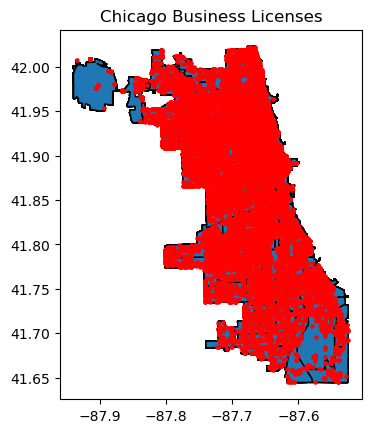

In [23]:
f, ax = plt.subplots()
chi["geometry"].plot(ax=ax,  edgecolor='black')
chi_biz.plot(ax=ax, color='red', markersize=5)
plt.title("Chicago Business Licenses")

Reminder: chi is the base df with block groups and community areas. 

In [24]:
# change active geometry to block group
chi["geometry"] = chi["blkGrpGeom"]
chi = chi[["community", "geometry", "cmntyGeom", "blkGrpGeom", "TRACTCE", "BLKGRPCE",  "ALAND","AWATER"]]

In [25]:
print(len(chi))
chi.head(5)

3992


,community,geometry,cmntyGeom,blkGrpGeom,TRACTCE,BLKGRPCE,ALAND,AWATER
0,AUSTIN,"POLYGON ((-87.76799 41.86555, -87.76774 41.865...","POLYGON ((-87.78942 41.91751, -87.78927 41.917...","POLYGON ((-87.76799 41.86555, -87.76774 41.865...",813400,1,415954,0
1,NaN,"POLYGON ((-87.80959 41.75345, -87.80942 41.753...",None,"POLYGON ((-87.80959 41.75345, -87.80942 41.753...",820502,2,455769,0
2,WEST ENGLEWOOD,"POLYGON ((-87.67475 41.76480, -87.67450 41.764...","POLYGON ((-87.65487 41.79417, -87.65487 41.794...","POLYGON ((-87.67475 41.76480, -87.67450 41.764...",672000,3,184727,0
3,GARFIELD RIDGE,"POLYGON ((-87.77593 41.79979, -87.77569 41.799...","POLYGON ((-87.73856 41.81871, -87.73853 41.818...","POLYGON ((-87.77593 41.79979, -87.77569 41.799...",560800,3,232891,0
4,NaN,"POLYGON ((-87.87421 41.80497, -87.87398 41.804...",None,"POLYGON ((-87.87421 41.80497, -87.87398 41.804...",819600,3,496985,0


In [26]:
chi_biz

,business_text,biz_cats_new,geometry,bizGeom
3,TTX COMPANY Miscellaneous Commercial Services,unknown,POINT (-87.66540 41.82028),POINT (-87.66540 41.82028)
4,Driftwood Tavern - Consumption of Liquor on Pr...,restaurant_bar_cafe,POINT (-87.65565 41.96166),POINT (-87.65565 41.96166)
5,Rock N Roll BP (GEI-157) Operation of a Fuel F...,unknown,POINT (-87.63249 41.89325),POINT (-87.63249 41.89325)
6,MEHRAB RESTAURANT Sale of Food Prepared Onsite...,restaurant_bar_cafe,POINT (-87.69133 41.99760),POINT (-87.69133 41.99760)
7,Silverwolf Productions LLC Freelance Writer (H...,unknown,POINT (-87.66539 41.93032),POINT (-87.66539 41.93032)
...,...,...,...,...
55419,LA LUNA BAKERY Retail Sales of Perishable Foods,food,POINT (-87.75203 41.92405),POINT (-87.75203 41.92405)
55420,Warlord Preparation of Food and Dining on Prem...,restaurant_bar_cafe,POINT (-87.72396 41.93902),POINT (-87.72396 41.93902)
55421,GAFFA FASHION Online Sales (Home Based Business),unknown,POINT (-87.64804 41.68350),POINT (-87.64804 41.68350)
55422,"M. GELLER, LIMITED Wholesale Jewelry, Watches ...",unknown,POINT (-87.62679 41.88197),POINT (-87.62679 41.88197)


In [27]:
# Make sure they're using the same projection reference
chi_biz.crs = chi.crs

# by right joining, we may end up missing some blk grps if we want to map later
biz_blkLvl =gpd.sjoin(chi, chi_biz, how="right",  op="intersects").reset_index(drop=True)

biz_blkLvl.drop(columns=["index_left"], inplace=True)
print(len(biz_blkLvl))

biz_blkLvl = biz_blkLvl.drop_duplicates(["blkGrpGeom", "business_text", "geometry"])
print(len(biz_blkLvl))

50633
47832


Now we have each point location of a businesses mapped to the block group that the point falls in.



In [28]:

biz_blkLvl.head()

,community,cmntyGeom,blkGrpGeom,TRACTCE,BLKGRPCE,ALAND,AWATER,business_text,biz_cats_new,geometry,bizGeom
0,NEW CITY,"POLYGON ((-87.63546 41.79448, -87.63599 41.794...","POLYGON ((-87.67632 41.82309, -87.67509 41.823...",610300,1,861039,0,TTX COMPANY Miscellaneous Commercial Services,unknown,POINT (-87.66540 41.82028),POINT (-87.66540 41.82028)
1,UPTOWN,"POLYGON ((-87.64102 41.95480, -87.64400 41.954...","POLYGON ((-87.65634 41.96176, -87.65610 41.961...",032100,2,68774,0,Driftwood Tavern - Consumption of Liquor on Pr...,restaurant_bar_cafe,POINT (-87.65565 41.96166),POINT (-87.65565 41.96166)
2,LOOP,"POLYGON ((-87.60949 41.88940, -87.60949 41.889...","POLYGON ((-87.63415 41.89479, -87.63387 41.894...",081700,2,285667,12366,Rock N Roll BP (GEI-157) Operation of a Fuel F...,unknown,POINT (-87.63249 41.89325),POINT (-87.63249 41.89325)
3,WEST RIDGE,"POLYGON ((-87.68465 42.01948, -87.68464 42.019...","POLYGON ((-87.69476 41.99765, -87.69452 41.997...",020802,4,162846,0,MEHRAB RESTAURANT Sale of Food Prepared Onsite...,restaurant_bar_cafe,POINT (-87.69133 41.99760),POINT (-87.69133 41.99760)
4,LINCOLN PARK,"POLYGON ((-87.63182 41.93258, -87.63182 41.932...","POLYGON ((-87.66839 41.93240, -87.66815 41.932...",070600,1,201803,0,Silverwolf Productions LLC Freelance Writer (H...,unknown,POINT (-87.66539 41.93032),POINT (-87.66539 41.93032)


In [29]:
# Keep the dataframe with biz point locations in tact because may need this in later analysis
biz_wide = biz_blkLvl

# wide summary of business licenses
biz_wide["blkGrpGeom"] = biz_wide["blkGrpGeom"].astype("str")


biz_wide = biz_wide.groupby(["blkGrpGeom","biz_cats_new"])["business_text"].count()

biz_wide = pd.DataFrame(biz_wide).reset_index()

biz_wide = biz_wide.pivot(index="blkGrpGeom", columns="biz_cats_new", values="business_text").reset_index().fillna(0)

In [30]:
# Make a biz geopandas frame 

biz_wide['geometry'] = gpd.GeoSeries.from_wkt(biz_wide["blkGrpGeom"])
biz_wide = gpd.GeoDataFrame(biz_wide, geometry='geometry').drop(columns="blkGrpGeom")
biz_wide.dtypes

biz_cats_new
beauty                  float64
entertainment           float64
food                    float64
repair                  float64
restaurant_bar_cafe     float64
retail_gm               float64
unknown                 float64
geometry               geometry
dtype: object

In [33]:
biz_wide.head(4)

biz_cats_new,beauty,entertainment,food,repair,restaurant_bar_cafe,retail_gm,unknown,geometry_str
0,0.0,0.0,4.0,1.0,1.0,0.0,1.0,"POLYGON ((-87.53165799999999 41.702716, -87.53..."
1,0.0,0.0,1.0,1.0,1.0,0.0,3.0,"POLYGON ((-87.531661 41.708219, -87.5314789999..."
2,0.0,0.0,0.0,0.0,0.0,0.0,4.0,"POLYGON ((-87.53166499999999 41.692192, -87.53..."
3,0.0,0.0,1.0,0.0,1.0,0.0,2.0,"POLYGON ((-87.535281 41.69039, -87.535281 41.6..."


Text(0.5, 1.0, 'dining/bar license counts')

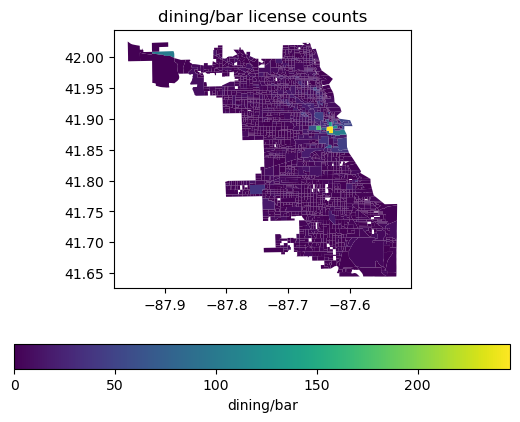

In [31]:
fig, ax = plt.subplots()
ax1 = biz_wide.plot(ax=ax, column='restaurant_bar_cafe', legend=True, 
             legend_kwds ={'label': "dining/bar",'orientation': "horizontal"})
ax1.set_title("dining/bar license counts")


In [32]:
biz_wide["geometry_str"] = biz_wide["geometry"].astype("str")
biz_wide.drop(columns=["geometry"], inplace=True)


# Crime

Add in crime data. 


In [34]:
crime_df = pd.read_csv(data_path + "Crimes_-_2020.csv")

In [35]:
print(len(crime_df["Location Description"].drop_duplicates()))
print(len(crime_df["Description"].drop_duplicates()))
print(len(crime_df["Primary Type"].drop_duplicates()))

166
419
33


In [36]:
crime_df["Date"] = pd.to_datetime(crime_df["Date"])
crime_df["YearMonth"] = crime_df["Date"].dt.to_period('M')

crime = crime_df[["Case Number", "Date", "YearMonth", "Primary Type","Description", 
                  "Location Description", "Arrest", "Domestic", "Latitude", "Longitude"]]


In [37]:
# Create my own crime catagories to have more succinct analysis when data is joined

crime.loc[:,"crime_cat"] = np.where(crime.loc[:,"Primary Type"].isin(["ASSAULT", "BATTERY"]), "Violent Crime",
                             np.where(crime.loc[:,"Primary Type"].isin(["CRIM SEXUAL ASSAULT", "CRIMINAL SEXUAL ASSAULT"]), "Sexual Assault",
                                     np.where(crime.loc[:,"Primary Type"].isin(["MOTOR VEHICLE THEFT", "ROBBERY", "THEFT"]), "Theft",
                                             np.where(crime.loc[:,"Primary Type"] == "HOMICIDE", "Homicide",
                                                     np.where(crime.loc[:,"Primary Type"].isin(["NARCOTICS", "OTHER NARCOTIC VIOLATION"]),"Narcotics",
                                                             "Other")))))



/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/pandas/core/indexing.py:1667: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value


In [38]:
# Make a crime geopandas frame and convert lat long to geometry
gdf_crime = gpd.GeoDataFrame(
    crime[["Case Number", "YearMonth","crime_cat","Arrest","Latitude", "Longitude"]], 
    geometry=gpd.points_from_xy( crime["Longitude"], crime["Latitude"])#, crs="EPSG:4269"
)

gdf_crime.drop(columns=["Longitude", "Latitude"], inplace=True)

# to preserve the crime points geometry after the join
gdf_crime["crimeGeom"] = gdf_crime["geometry"]

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/geopandas/array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


In [39]:
# Make sure they're using the same projection reference
gdf_crime.crs =chi.crs

# join the points to chi df blk group polygons
crime_blk = gpd.sjoin(chi[["geometry","blkGrpGeom"]], gdf_crime, how="right",  op="intersects").reset_index(drop=True)

crime_blk.drop(columns=["index_left"], inplace=True)

crime_blk.head(4)


,blkGrpGeom,Case Number,YearMonth,crime_cat,Arrest,geometry,crimeGeom
0,"POLYGON ((-87.62664 41.83101, -87.62649 41.831...",JD226426,2020-05,Theft,False,POINT (-87.62175 41.83048),POINT (-87.62175 41.83048)
1,"POLYGON ((-87.64142 41.83811, -87.64117 41.838...",JD209965,2020-04,Violent Crime,True,POINT (-87.63962 41.83631),POINT (-87.63962 41.83631)
2,"POLYGON ((-87.55404 41.74826, -87.55380 41.748...",JD282112,2020-07,Violent Crime,True,POINT (-87.54918 41.74761),POINT (-87.54918 41.74761)
3,"POLYGON ((-87.67390 41.77932, -87.67366 41.779...",JD381597,2020-09,Violent Crime,False,POINT (-87.67137 41.77488),POINT (-87.67137 41.77488)


In [40]:
# get crime counts by block group

"""
k = pd.DataFrame(df1.groupby([df1["geometry"].astype("str"),"community","crime_cat"])["Case Number"].count())
k.reset_index().rename(columns={"Case Number":"crime_counts"})
"""

# sum up crimes and arrests in relevant block groups

crime_blk["blkGrpGeom_str"] = crime_blk["blkGrpGeom"].astype("str")

crime_wide = crime_blk.groupby(["blkGrpGeom_str", "crime_cat"]).agg({"Case Number": 'count', "Arrest": 'sum'}).reset_index() \
.rename(columns={"Case Number":"crime_cnt", "Arrest":"arrest_cnt"})

c = crime_wide.pivot(index="blkGrpGeom_str", columns="crime_cat", values="crime_cnt").reset_index().fillna(0)

# dictionary for renaming wide columns
a_dic = {"Homicide": "H_Arrests", "Narcotics": "N_Arrests", "Other":"O_Arrests", "Sexual Assault": "SA_Arrests",
"Theft":"T_Arrests", "Violent Crime":"VC_Arrests"}

a = crime_wide.pivot(index="blkGrpGeom_str", columns="crime_cat", values="arrest_cnt").reset_index().fillna(0) \
.rename(columns= a_dic)

# put crimes and arrests in one df
crime_wide = c.merge(a, on="blkGrpGeom_str")

#back to geopandas
#crime_wide['geometry'] = gpd.GeoSeries.from_wkt(cta_blk["blkGrpGeom_str"])
#crime_wide = gpd.GeoDataFrame(crime_wide, geometry='geometry')

crime_wide.head(5)

crime_cat,blkGrpGeom_str,Homicide,Narcotics,Other,Sexual Assault,Theft,Violent Crime,H_Arrests,N_Arrests,O_Arrests,SA_Arrests,T_Arrests,VC_Arrests
0,None,0.0,224.0,2423.0,104.0,1248.0,278.0,0.0,224.0,71.0,7.0,14.0,12.0
1,"POLYGON ((-87.53165799999999 41.702716, -87.53...",0.0,2.0,14.0,0.0,7.0,17.0,0.0,2.0,0.0,0.0,0.0,2.0
2,"POLYGON ((-87.531661 41.708219, -87.5314789999...",0.0,0.0,15.0,0.0,15.0,13.0,0.0,0.0,1.0,0.0,1.0,0.0
3,"POLYGON ((-87.53166499999999 41.692192, -87.53...",0.0,0.0,30.0,0.0,17.0,12.0,0.0,0.0,1.0,0.0,0.0,3.0
4,"POLYGON ((-87.535281 41.69039, -87.535281 41.6...",0.0,0.0,11.0,0.0,9.0,4.0,0.0,0.0,1.0,0.0,0.0,1.0


# Combining the Data - Chi Boundaries + CTA + Business + Crime

## Look at the datasets

<AxesSubplot:>

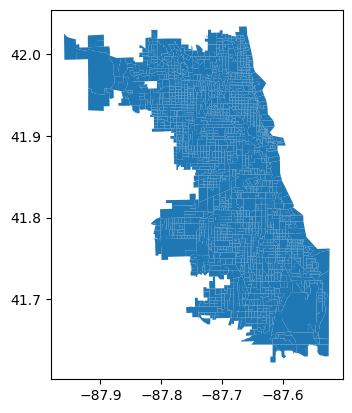

In [48]:
chi[chi["community"].notna()].plot()

In [49]:
print(len(chi))
chi.head(3)

3992


,community,geometry,cmntyGeom,blkGrpGeom,TRACTCE,BLKGRPCE,ALAND,AWATER
0,AUSTIN,"POLYGON ((-87.76799 41.86555, -87.76774 41.865...","POLYGON ((-87.78942 41.91751, -87.78927 41.917...","POLYGON ((-87.76799 41.86555, -87.76774 41.865...",813400,1,415954,0
1,NaN,"POLYGON ((-87.80959 41.75345, -87.80942 41.753...",None,"POLYGON ((-87.80959 41.75345, -87.80942 41.753...",820502,2,455769,0
2,WEST ENGLEWOOD,"POLYGON ((-87.67475 41.76480, -87.67450 41.764...","POLYGON ((-87.65487 41.79417, -87.65487 41.794...","POLYGON ((-87.67475 41.76480, -87.67450 41.764...",672000,3,184727,0


In [50]:
print(len(cta_blk))
cta_blk.head(3)

129


,cta_L_cnt,geometry_str
0,1,"POLYGON ((-87.60593 41.78041, -87.605673 41.78..."
1,1,"POLYGON ((-87.615622 41.78023899999999, -87.61..."
2,1,"POLYGON ((-87.62140699999999 41.816564, -87.62..."


In [51]:
print(len(biz_wide))
print(biz_wide.dtypes)
biz_wide.head(3)

2121
biz_cats_new
beauty                 float64
entertainment          float64
food                   float64
repair                 float64
restaurant_bar_cafe    float64
retail_gm              float64
unknown                float64
geometry_str            object
dtype: object


biz_cats_new,beauty,entertainment,food,repair,restaurant_bar_cafe,retail_gm,unknown,geometry_str
0,0.0,0.0,4.0,1.0,1.0,0.0,1.0,"POLYGON ((-87.53165799999999 41.702716, -87.53..."
1,0.0,0.0,1.0,1.0,1.0,0.0,3.0,"POLYGON ((-87.531661 41.708219, -87.5314789999..."
2,0.0,0.0,0.0,0.0,0.0,0.0,4.0,"POLYGON ((-87.53166499999999 41.692192, -87.53..."


In [52]:
print(len(crime_wide))
crime_wide.head(3)

2274


crime_cat,blkGrpGeom_str,Homicide,Narcotics,Other,Sexual Assault,Theft,Violent Crime,H_Arrests,N_Arrests,O_Arrests,SA_Arrests,T_Arrests,VC_Arrests
0,None,0.0,224.0,2423.0,104.0,1248.0,278.0,0.0,224.0,71.0,7.0,14.0,12.0
1,"POLYGON ((-87.53165799999999 41.702716, -87.53...",0.0,2.0,14.0,0.0,7.0,17.0,0.0,2.0,0.0,0.0,0.0,2.0
2,"POLYGON ((-87.531661 41.708219, -87.5314789999...",0.0,0.0,15.0,0.0,15.0,13.0,0.0,0.0,1.0,0.0,1.0,0.0


## Combine Datasets

In [53]:
cta_blk.dtypes

cta_L_cnt        int64
geometry_str    object
dtype: object

In [54]:
biz_wide.dtypes

biz_cats_new
beauty                 float64
entertainment          float64
food                   float64
repair                 float64
restaurant_bar_cafe    float64
retail_gm              float64
unknown                float64
geometry_str            object
dtype: object

In [78]:
# when it comes to joining exact polygons, to get expected matching result
# it's better to just convert to a string and do a normal join/merge


#CTA
chi["geometry_str"] = chi["geometry"].astype("str")
chi1 = pd.merge(chi, cta_blk, how="left", on="geometry_str")

#-----

#biz license
chi2 = pd.merge(chi1, biz_wide, how="left", on="geometry_str")
chi2.iloc[:,7:] = chi2.iloc[:,7:].fillna(0)

#---

#Crime
chi3 = pd.merge(chi2, crime_wide, how="left", left_on="geometry_str", right_on="blkGrpGeom_str")
chi3.iloc[:,7:] = chi3.iloc[:,7:].fillna(0)



In [56]:
# FOCUSING ON JUST CHICAGO DATA, NOT COOK COUNTY
chi3 = chi3[chi3["community"].notna()]

In [57]:
print(len(chi3))
chi3.head()

2332


,community,geometry,cmntyGeom,blkGrpGeom,TRACTCE,BLKGRPCE,ALAND,AWATER,geometry_str,cta_L_cnt,...,Other,Sexual Assault,Theft,Violent Crime,H_Arrests,N_Arrests,O_Arrests,SA_Arrests,T_Arrests,VC_Arrests
0,AUSTIN,"POLYGON ((-87.76799 41.86555, -87.76774 41.865...","POLYGON ((-87.78942 41.91751, -87.78927 41.917...","POLYGON ((-87.76799 41.86555, -87.76774 41.865...",813400,1,415954,0,POLYGON ((-87.76798599999999 41.86554599999999...,0.0,...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,WEST ENGLEWOOD,"POLYGON ((-87.67475 41.76480, -87.67450 41.764...","POLYGON ((-87.65487 41.79417, -87.65487 41.794...","POLYGON ((-87.67475 41.76480, -87.67450 41.764...",672000,3,184727,0,"POLYGON ((-87.674745 41.764799, -87.6745019999...",0.0,...,66.0,0.0,28.0,39.0,0.0,1.0,15.0,0.0,0.0,5.0
3,GARFIELD RIDGE,"POLYGON ((-87.77593 41.79979, -87.77569 41.799...","POLYGON ((-87.73856 41.81871, -87.73853 41.818...","POLYGON ((-87.77593 41.79979, -87.77569 41.799...",560800,3,232891,0,POLYGON ((-87.77593299999999 41.79978699999999...,0.0,...,13.0,0.0,6.0,8.0,0.0,0.0,0.0,0.0,1.0,2.0
28,AUSTIN,"POLYGON ((-87.77955 41.88006, -87.77944 41.880...","POLYGON ((-87.78942 41.91751, -87.78927 41.917...","POLYGON ((-87.77955 41.88006, -87.77944 41.880...",813000,1,166465,0,"POLYGON ((-87.77955299999999 41.880056, -87.77...",0.0,...,4.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
29,AUSTIN,"POLYGON ((-87.77943 41.87639, -87.77918 41.876...","POLYGON ((-87.78942 41.91751, -87.78927 41.917...","POLYGON ((-87.77943 41.87639, -87.77918 41.876...",813000,2,166257,0,"POLYGON ((-87.77942899999999 41.876388, -87.77...",0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [58]:
list(chi3.columns)

['community',
 'geometry',
 'cmntyGeom',
 'blkGrpGeom',
 'TRACTCE',
 'BLKGRPCE',
 'ALAND',
 'AWATER',
 'geometry_str',
 'cta_L_cnt',
 'beauty',
 'entertainment',
 'food',
 'repair',
 'restaurant_bar_cafe',
 'retail_gm',
 'unknown',
 'blkGrpGeom_str',
 'Homicide',
 'Narcotics',
 'Other',
 'Sexual Assault',
 'Theft',
 'Violent Crime',
 'H_Arrests',
 'N_Arrests',
 'O_Arrests',
 'SA_Arrests',
 'T_Arrests',
 'VC_Arrests']

# Analysis

So now with info about L's, businesses, and crime, what are some interesting things to ask. How to approach looking for insights.

In [59]:
# Arrest rates might be interesting, so add it to the data

def rate_calc(df, col1, col2, new_col_name):
    """new_col_name is an input string
    df is the data frame"""
    df[new_col_name] = df[col1]/df[col2]
    return df

arrests = ["H_Arrests", "N_Arrests", "O_Arrests", "SA_Arrests", "T_Arrests", "VC_Arrests"]
crimes = ["Homicide", "Narcotics", "Other", "Sexual Assault", "Theft", "Violent Crime"]
rate_names = ["H_ArrstRate", "N_ArrstRate", "O_ArrstRate", "SA_ArrstRate", "T_ArrstRate", "VC_ArrstRate"]

for i in range(6):
    
    chi3 = rate_calc(chi3,arrests[i],crimes[i], rate_names[i])

chi3.iloc[:,7:] = chi3.iloc[:,7:].fillna(0)

In [61]:
# corr plot
corr = chi3.corr()
corr.style.background_gradient(cmap='coolwarm')

# "cta_L_cnt", "food", "restaurant_bar_cafe", "beauty", "Homicide", "Narcotics", "Sexual Assault", "Theft", "Violent Crime",\
#"H_Arrests", "N_Arrests", "T_Arrests","VC_Arrests"

,ALAND,AWATER,cta_L_cnt,beauty,entertainment,food,repair,restaurant_bar_cafe,retail_gm,unknown,Homicide,Narcotics,Other,Sexual Assault,Theft,Violent Crime,H_Arrests,N_Arrests,O_Arrests,SA_Arrests,T_Arrests,VC_Arrests,H_ArrstRate,N_ArrstRate,O_ArrstRate,SA_ArrstRate,T_ArrstRate,VC_ArrstRate
ALAND,1.000000,0.422273,0.042604,-0.021709,-0.004845,0.052951,0.073884,0.029377,0.022707,0.076509,0.015560,0.101121,0.150972,0.007737,0.150275,0.116764,0.013476,0.101112,0.214580,-0.010729,0.122010,0.123615,0.015812,0.017760,0.017947,-0.016813,0.016357,-0.018294
AWATER,0.422273,1.000000,0.031546,-0.017284,0.069402,0.040088,0.083966,0.060155,-0.000650,0.080268,0.013747,-0.006411,0.100240,0.056620,0.113542,0.101043,0.030057,-0.006388,0.082187,0.027432,0.082869,0.081588,0.040715,0.017368,0.013654,0.034393,0.006817,-0.000997
cta_L_cnt,0.042604,0.031546,1.000000,0.202948,0.175670,0.558363,0.309187,0.623900,0.083649,0.745915,0.034674,0.088284,0.438930,0.175694,0.568654,0.273539,0.064396,0.088243,0.335964,0.140152,0.461606,0.360007,0.042603,0.067775,0.063760,0.032875,0.091001,0.048239
beauty,-0.021709,-0.017284,0.202948,1.000000,0.062651,0.484238,0.237377,0.464696,0.198475,0.385370,-0.013795,-0.003393,0.185469,0.062018,0.324225,0.088288,0.015061,-0.003391,0.090481,0.006531,0.252812,0.118915,0.021429,0.072459,0.021559,-0.015498,0.146418,0.062460
entertainment,-0.004845,0.069402,0.175670,0.062651,1.000000,0.185341,0.045603,0.216101,0.028420,0.170226,-0.032420,-0.015886,0.071062,0.037464,0.209939,0.028579,-0.023612,-0.015864,0.028955,0.004320,0.178391,0.045946,-0.023040,-0.047109,-0.024114,-0.009089,0.051649,0.031255
food,0.052951,0.040088,0.558363,0.484238,0.185341,1.000000,0.390567,0.835370,0.356039,0.774172,0.058753,0.086801,0.441200,0.184928,0.633302,0.255606,0.083598,0.086800,0.303487,0.138656,0.458181,0.325363,0.054658,0.115423,0.060885,0.056575,0.174311,0.088307
repair,0.073884,0.083966,0.309187,0.237377,0.045603,0.390567,1.000000,0.328112,0.242042,0.419466,0.019796,0.034340,0.253892,0.098731,0.331313,0.152710,0.020474,0.034325,0.186400,0.015979,0.339366,0.175876,0.023172,0.099357,0.052621,-0.005748,0.118234,0.044664
restaurant_bar_cafe,0.029377,0.060155,0.623900,0.464696,0.216101,0.835370,0.328112,1.000000,0.159592,0.839779,-0.004538,0.020016,0.392971,0.185325,0.639969,0.181883,0.041476,0.019998,0.246517,0.134777,0.431269,0.259135,0.026682,0.044930,0.017408,0.053937,0.108927,0.065229
retail_gm,0.022707,-0.000650,0.083649,0.198475,0.028420,0.356039,0.242042,0.159592,1.000000,0.173269,0.006897,0.019661,0.080089,0.022530,0.121963,0.061440,0.007337,0.019679,0.054415,0.014555,0.097757,0.065228,0.001358,0.039405,0.025422,0.002246,0.046611,0.012223
unknown,0.076509,0.080268,0.745915,0.385370,0.170226,0.774172,0.419466,0.839779,0.173269,1.000000,0.051131,0.066199,0.502868,0.212340,0.680069,0.272926,0.070749,0.066209,0.330572,0.176445,0.460740,0.342917,0.050176,0.080403,0.040521,0.060078,0.108640,0.046784


* restuarants/bar density has correlation with thefts and L line/station counts; also with other types of food establishments, which make sense. 
* unclassified business is correlated with cta station counts

Crime
* Narcotics is the only crime almost perfectly correlated with number of arrests. And if we look at scatter plot matrix, it is nearly a perfect line
* Violent crime and VC arrests also have a strong linear relationship.
* this may be an indication that areas with that experience these kinds of crimes may get policed more. Or that community is more vigilant? Would want to look at a map and see if VC and narcotics tend to be concentrated in certain areas
* Arrest rate for sexual assault highly correlated with sexual assault

Created a scatter plot to look more closely into the relationships noted above.
* linear relationship involving CTA are actually weak. Same for sexual assault/arrest rate


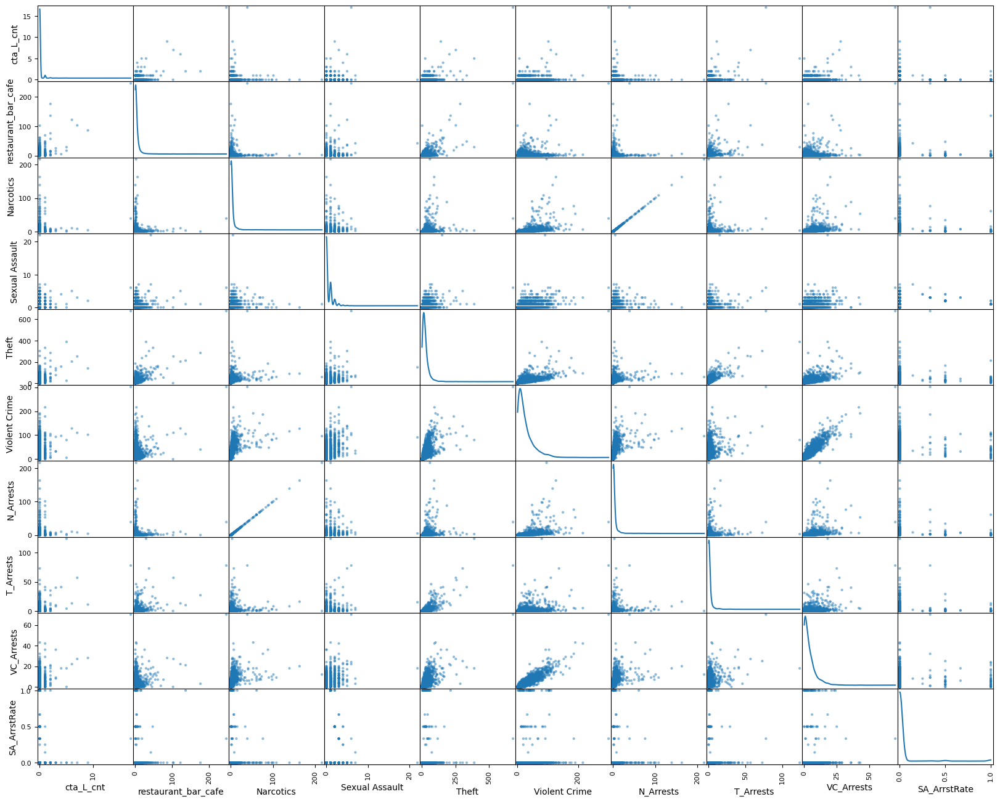

In [62]:
keep_vars = [ "cta_L_cnt", "restaurant_bar_cafe",  "Narcotics", "Sexual Assault", "Theft", "Violent Crime",\
 "N_Arrests", "T_Arrests","VC_Arrests", "SA_ArrstRate"]
pd.plotting.scatter_matrix(chi3[keep_vars], diagonal = 'kde',  figsize=[20,16])
plt.show()

### Moved on to looking at distributions

<AxesSubplot:>

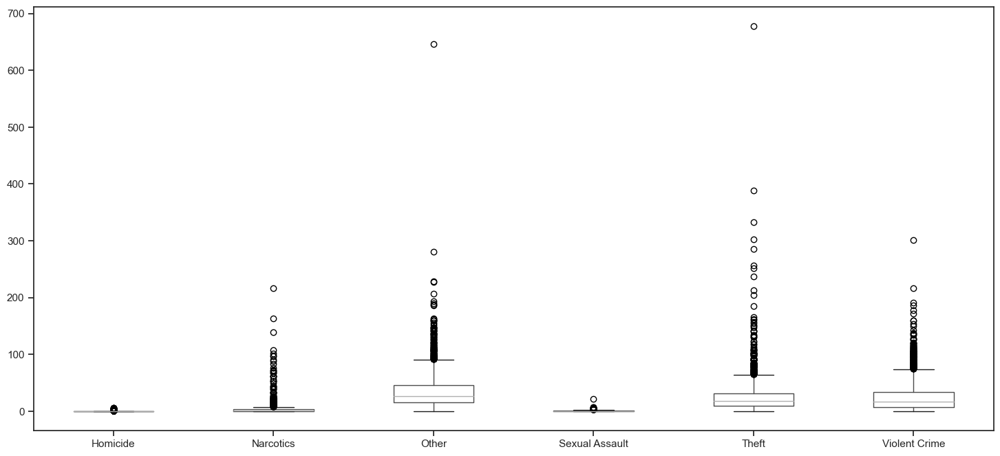

In [295]:
chi3[crimes].boxplot(figsize=[18,8], grid= False)


<AxesSubplot:>

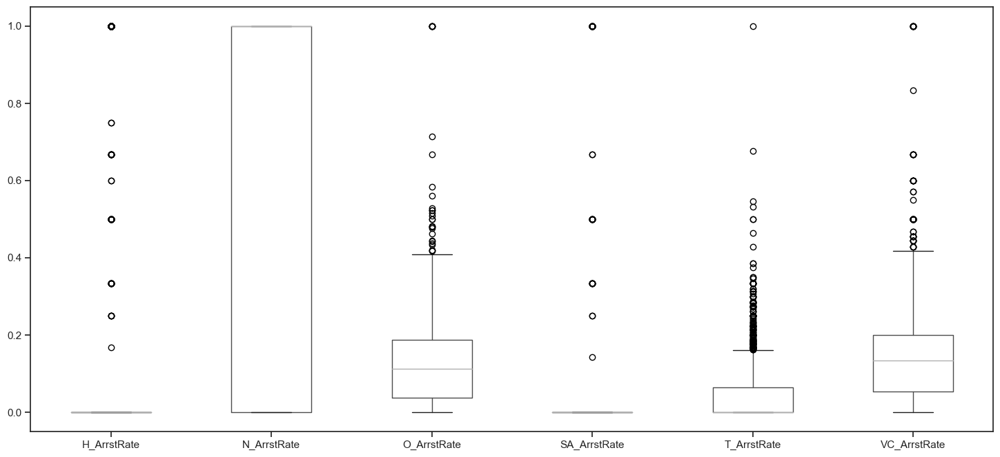

In [296]:
chi3[rate_names].boxplot(figsize=[18,8], grid= False)


by crime type, variability of crimes committed is alot.
For homicide, narcotics, and sexual assault, some 75% of block groups do not have counts for these crimes.

for arrest rates, most blocks (half) have close to 0 arrest rate, but there are some outlier blocks that get more arrests/crime 

14.0


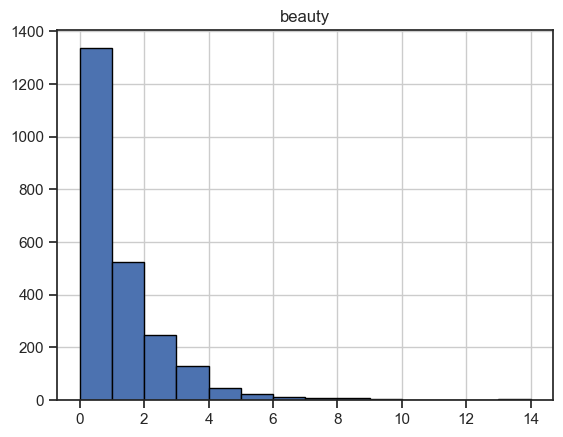

4.0


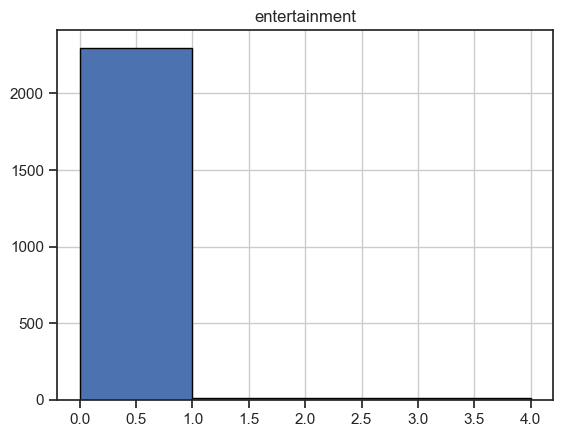

140.0


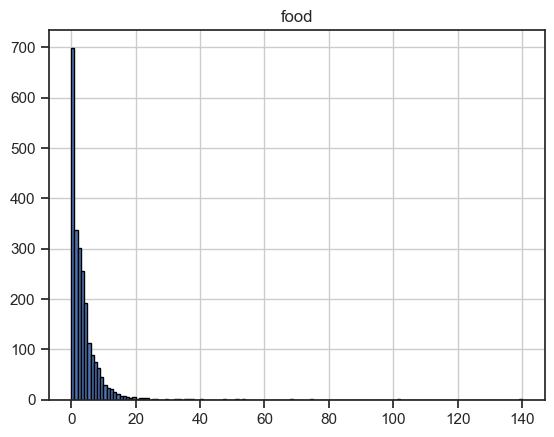

75.0


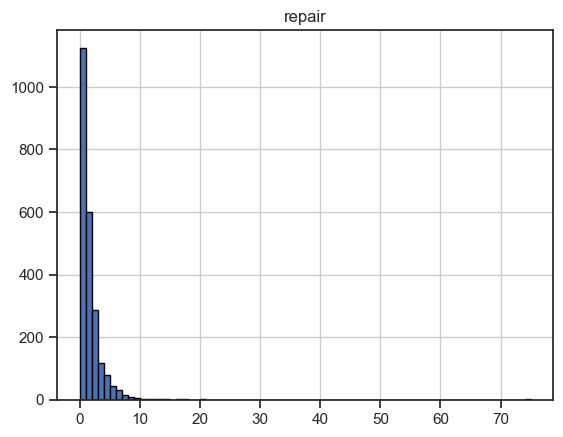

246.0


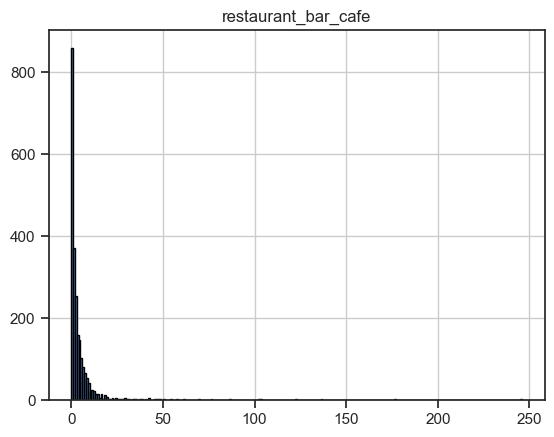

636.0


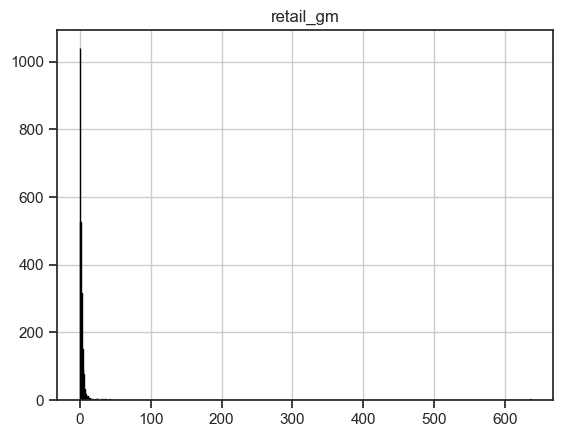

787.0


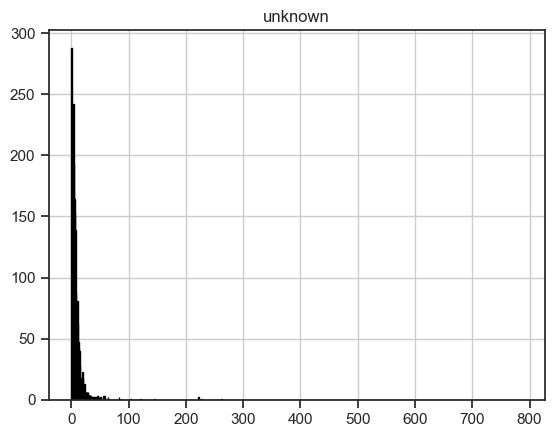

In [297]:
biz_cats = ['beauty', 'entertainment','food','repair','restaurant_bar_cafe','retail_gm','unknown']

for i in biz_cats:
    binrange = chi3[i].max() - chi3[i].min()
    cutoff = np.quantile(chi3[i], [.87])
    print(binrange)
    chi3[i].hist(edgecolor="black", bins=round(binrange))
    
    plt.title(i)
    plt.show()

for business licenses, we see that most block groups have very few, but there are some with an overinflated amount 

moved on to trying to see if there's any spatial patterns for our data for putting in on a map. Where are the places that have lots of businesses, particularly places to go out?


### Looking at Place

In [298]:
type(chi3)

geopandas.geodataframe.GeoDataFrame

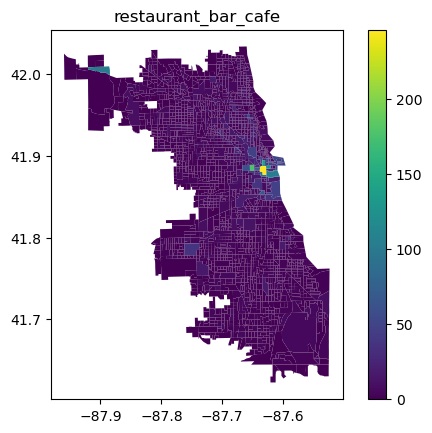

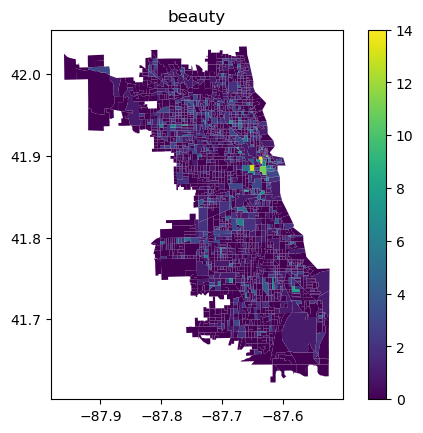

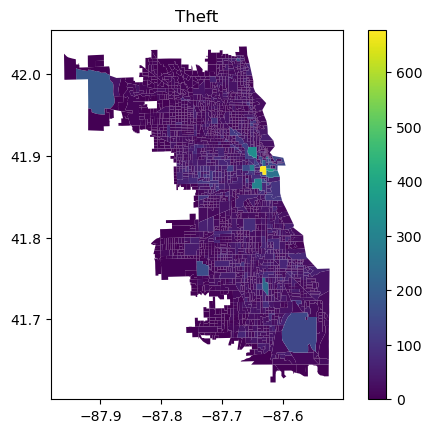

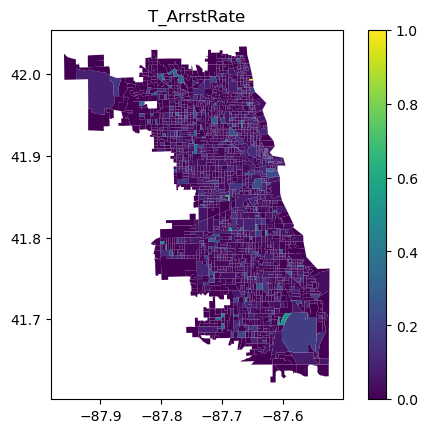

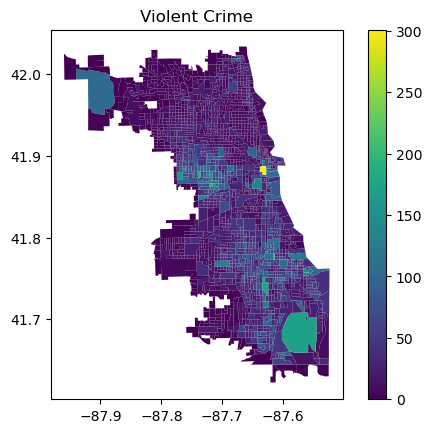

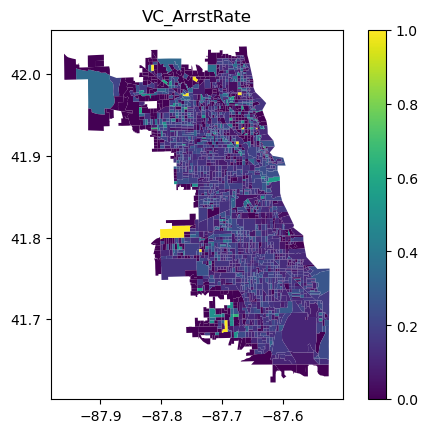

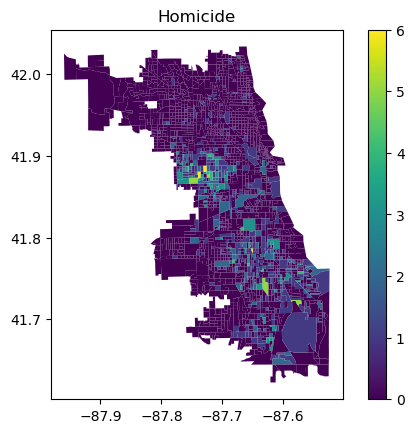

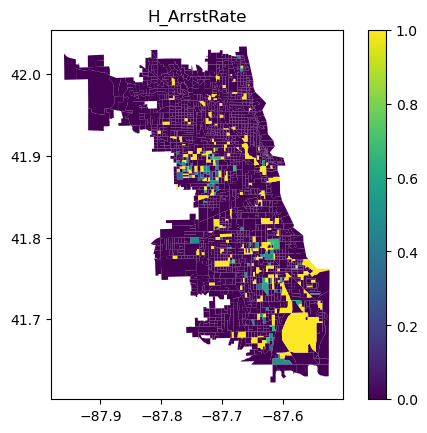

In [63]:
pltlst =['restaurant_bar_cafe', 'beauty', 'Theft', "T_ArrstRate", "Violent Crime", "VC_ArrstRate", "Homicide", "H_ArrstRate"]

for i in pltlst:
    
    chi3.plot(column=i,legend=True)
    plt.title(i)
    plt.show()



as expected, lot of high volume restaurant/bar blocks downtown and near north side I also expected lots of theft to be in this area, which there was and also heading northwest, seemingly up milwaukee to bucktown/wicker park area. I expected to see relatively high arrest rates here, but didn't I saw a lot of violent crimes in downtown area, which I didn't expect. But also saw a lot on West and South side unexpectedly, seems to be a relatively consistent smathering of beauty business throughout the city These data made me wonder about neighborhoods.

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/geopandas/geodataframe.py:1321: UserWarning: Geometry column does not contain geometry.
  warnings.warn("Geometry column does not contain geometry.")


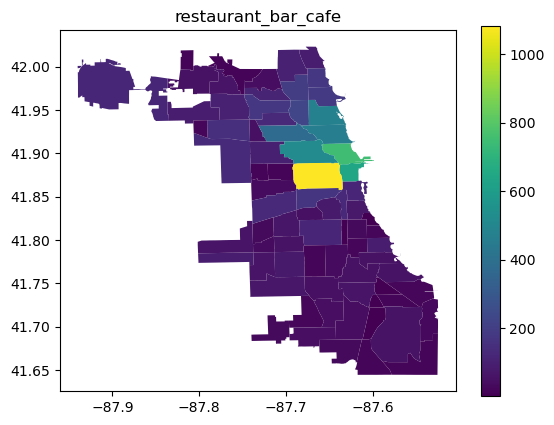

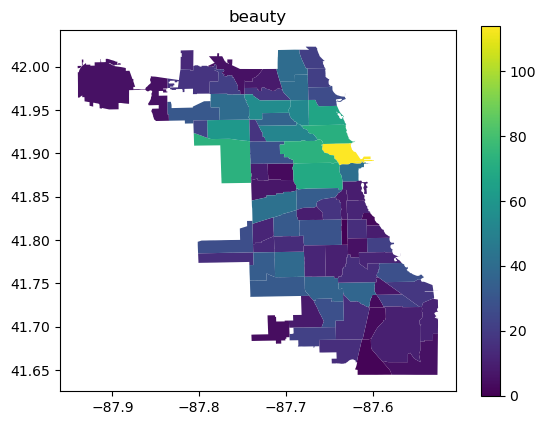

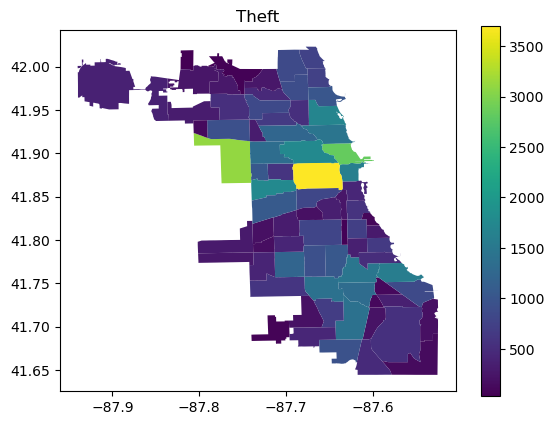

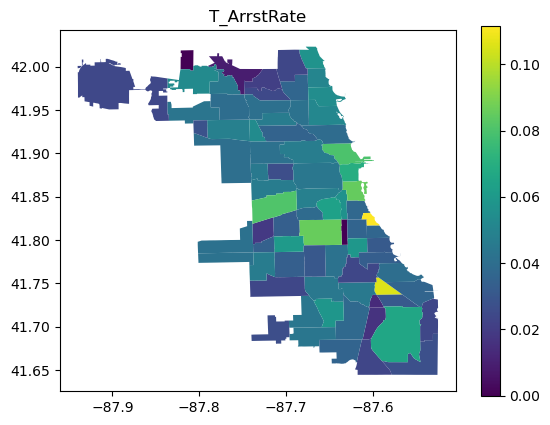

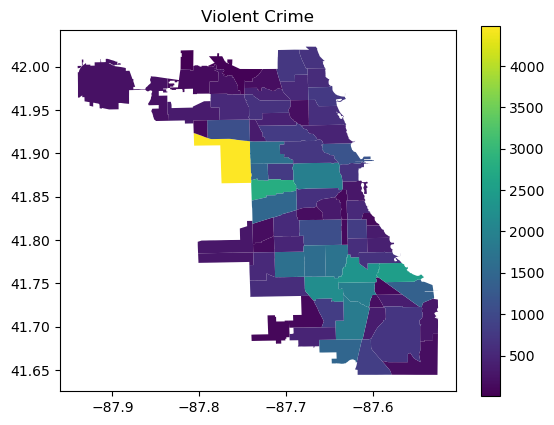

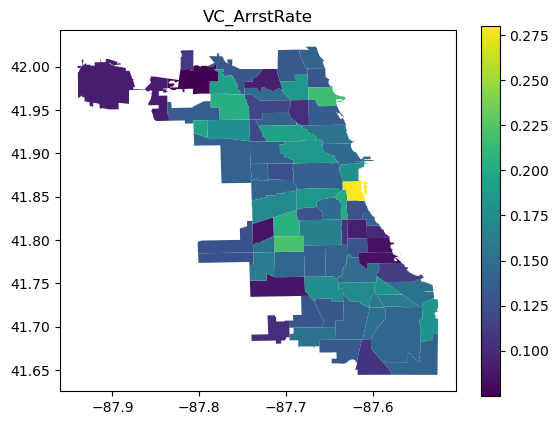

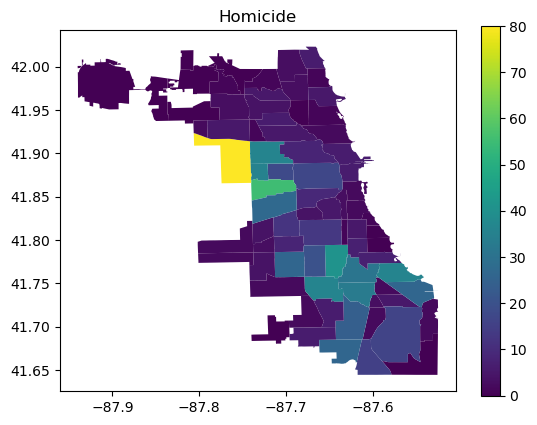

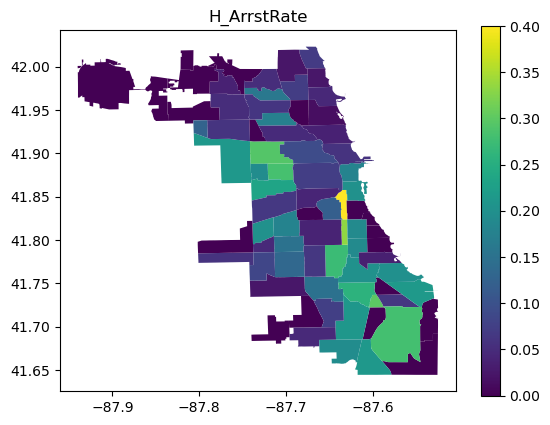

In [64]:
# Want to see those plots at community level
#pltlst = =['restaurant_bar_cafe', 'beauty', 'Theft', "T_ArrstRate", "Violent Crime", "VC_ArrstRate", "Homicide", "H_ArrstRate"]
z=chi3
z["geometry"] = z["cmntyGeom"].astype(str)

chi3_byCmnty_sub = z.groupby(["community", "geometry"]).agg({'restaurant_bar_cafe' : 'sum', 
                                            'beauty' : 'sum', 
                                            'Theft' : 'sum',
                                            "Violent Crime" : 'sum',
                                            "Homicide" : 'sum',
                                            "T_ArrstRate" : 'mean',
                                            "VC_ArrstRate" : 'mean',
                                            "H_ArrstRate": 'mean'}).reset_index() 

chi3_byCmnty_sub['geometry'] = gpd.GeoSeries.from_wkt(chi3_byCmnty_sub['geometry'])
chi3_byCmnty_sub = gpd.GeoDataFrame(chi3_byCmnty_sub, geometry='geometry')

for i in pltlst:
    
    chi3_byCmnty_sub.drop(columns='community').plot(column=i,legend=True)
    plt.title(i)
    plt.show()

Looking at the maps by community tell a clearer story.
* More /bars and restaurants downtown and north side
* Beauty businesses prevalent in all parts of the city
* Thefts all over, but northside and downtown have more (Austin on the West side is also top)
* Theft arrest rates are low across the city, topping out a about 12%.
* Violent crime happens more on west and south sides. Same for homicides

Below we can see the bar counts by communit for these features

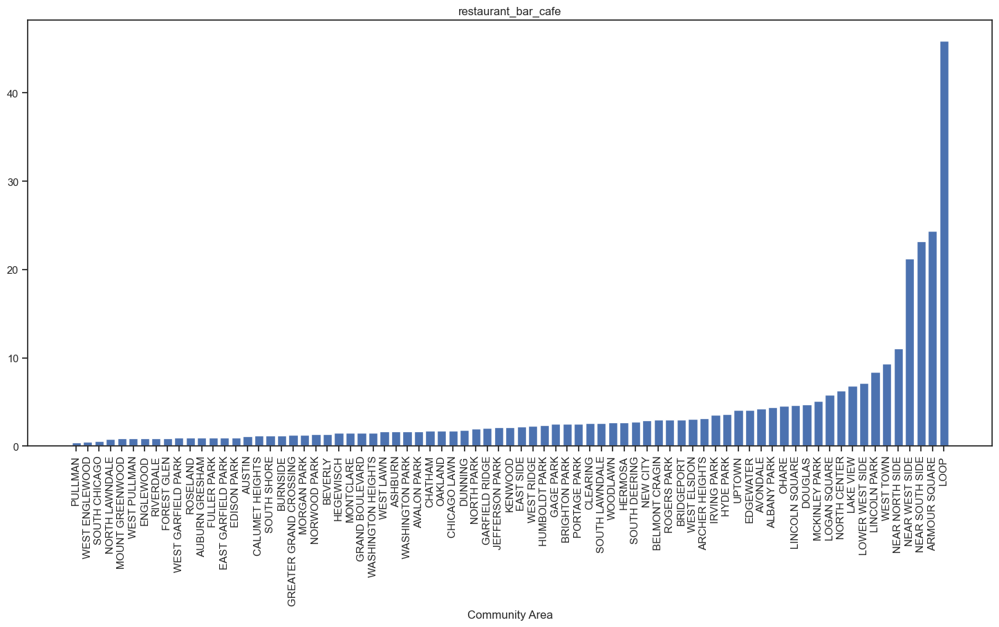

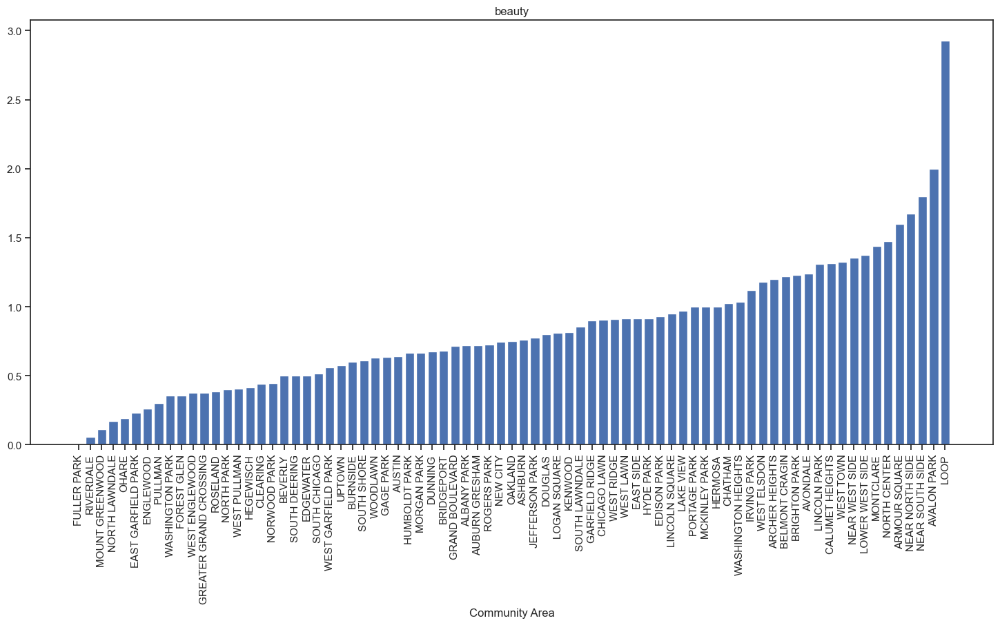

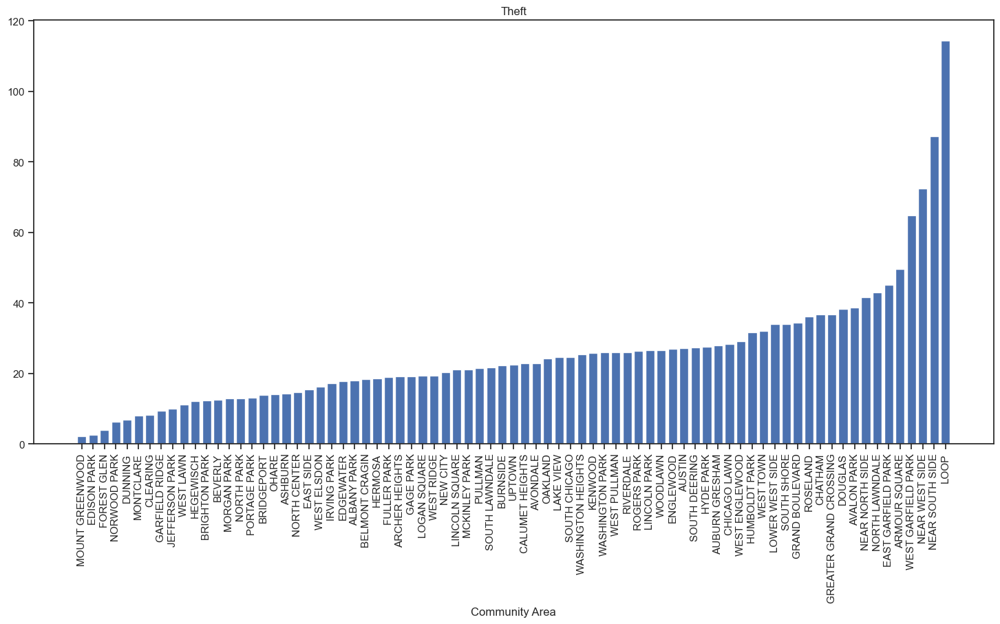

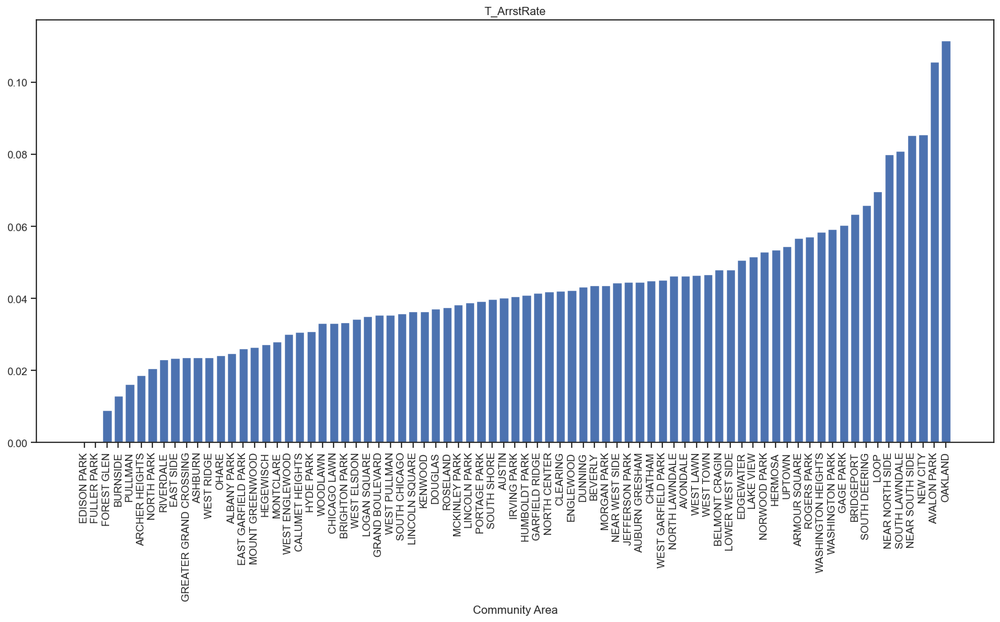

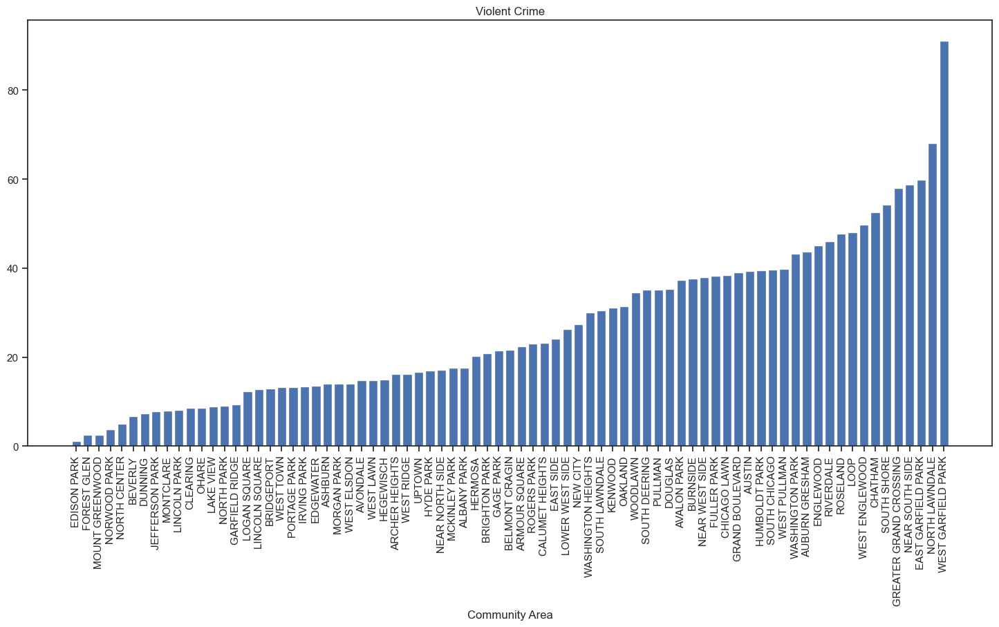

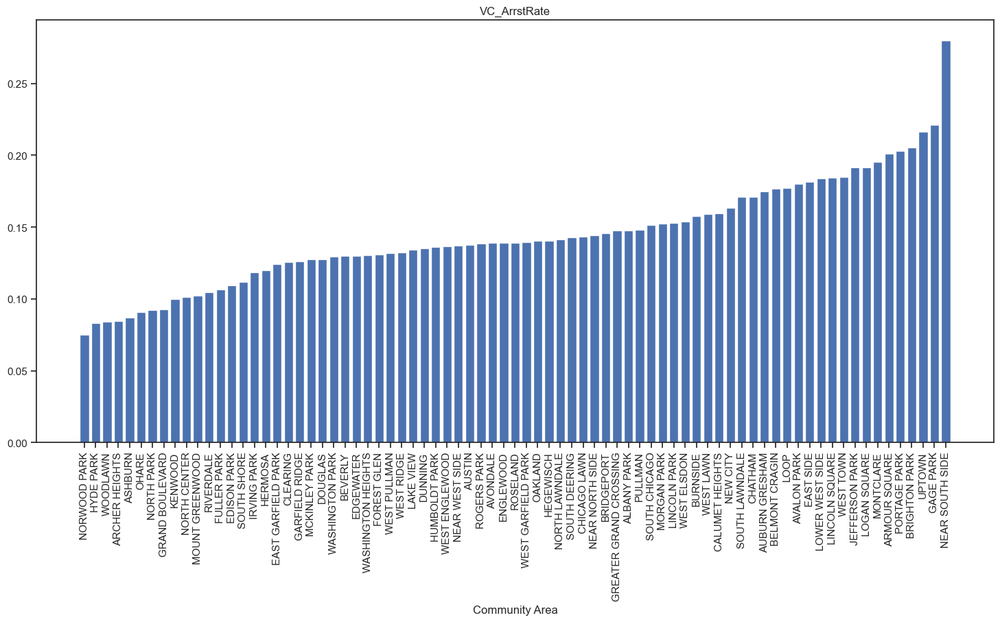

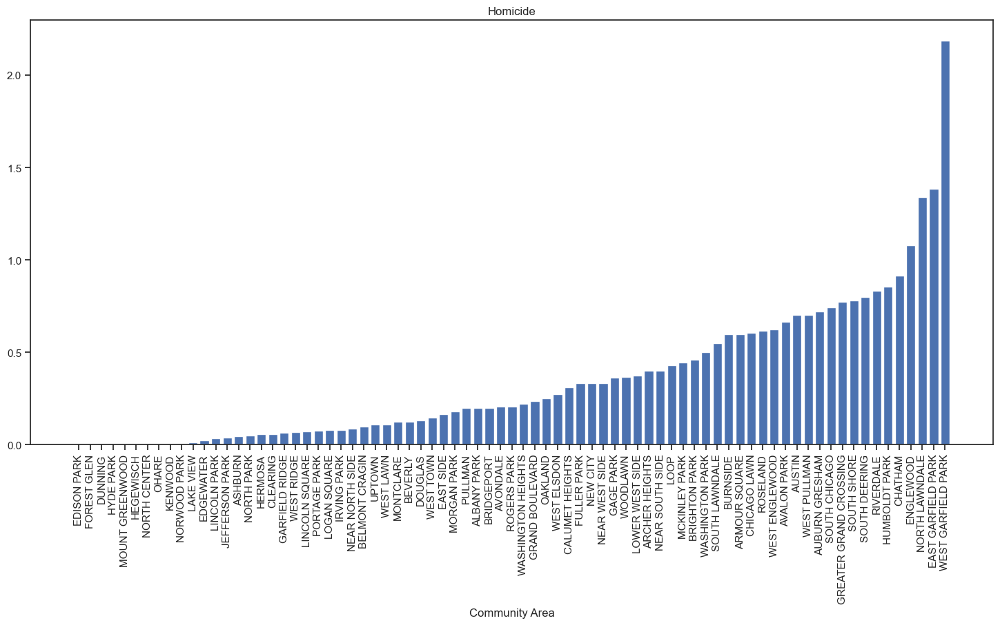

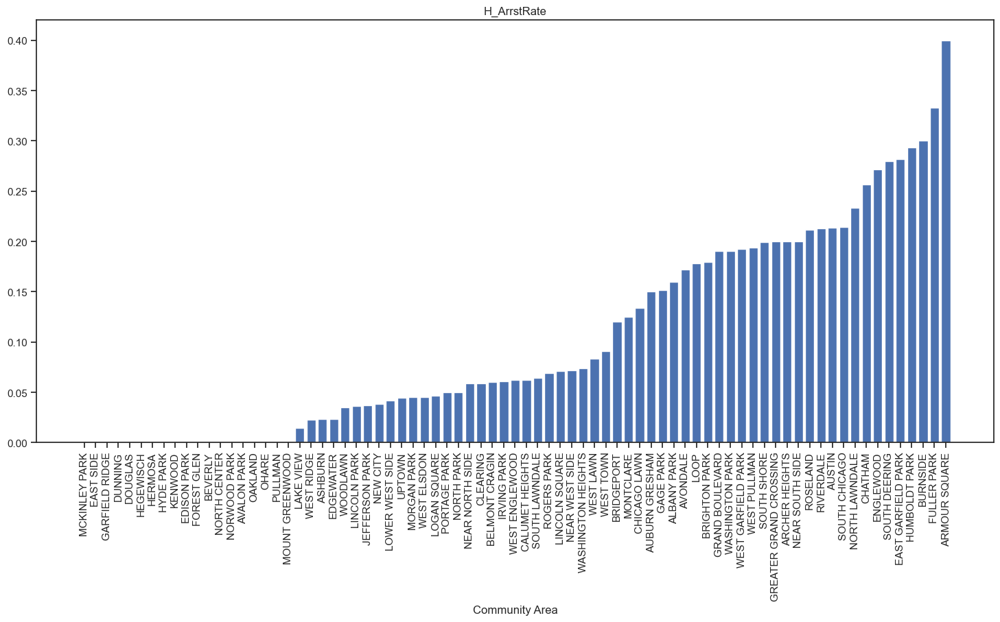

In [301]:
for i in pltlst:

    ByComm = chi3.groupby("community")[i].mean().sort_values()

    fig, ax = plt.subplots(figsize=[18,8])
    ax.bar(ByComm.index, ByComm)
    ax.set_title(i)
    ax.set_xlabel("Community Area")
    #ax.set_ylabel("(Mean)", " ", i)
    plt.xticks(rotation = 90)

    plt.show()
    
    #fig = px.bar(data_canada, x='year', y='pop')
    #fig.show()

* Uptown has top 3 violent crime arrest rate, but is in bottom 50% for violent crimes same 
* for Gage Park (it seems to be right in middle of the pack for violent crimes, but has second highest arrest rate)
* Near south side has high amount of vc and high arrest rate This raises questions about policing...which communities have higher effort? Or maybe there's more community assistance with making an arrest?

### Looking at area buffers

Switching gears: I think living close to an el is important. What can I dig up about crime and stuff to do within a
certain radius of an el station

It takes about 10 minutes walking to go half a mile, so I will make a half mile radius around L station

* this will highlight some different kind of spatial analysis skills, namely drawing a radius around a point and capturing data in that manner

I need: 
 * geo- points for L stations.
 * geo-points for the crime cat I want to look at
 * geo-points for the business type I want to look at
 
https://matplotlib.org/stable/users/explain/colors/colormaps.html

In [302]:
alt_cta.head()

,MAP_ID,cta_L_cnt,geometry,ctaGeom
0,40010,1,POINT (-87.77681 41.87085),POINT (-87.77681 41.87085)
1,40020,1,POINT (-87.80318 41.88685),POINT (-87.80318 41.88685)
2,40030,1,POINT (-87.72540 41.88541),POINT (-87.72540 41.88541)
3,40040,4,POINT (-87.63374 41.87872),POINT (-87.63374 41.87872)
4,40050,2,POINT (-87.68354 42.04771),POINT (-87.68354 42.04771)


In [303]:
alt_cta.crs
#crime_blk,gdf_crime,chi_biz
#NAD_1983_StatePlane_Illinois_East_FIPS_1201_Feet
#1 mile = 1609.34 meters
#alt_cta.to_crs({"init": "EPSG:3857"})

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### How to calculate Buffers around a Point

I'm interested to know what are the businesses and crimes within a certain radius of an L station, since to me living walking distance to an L is desirable. Is it really desirable?

In [65]:
def miles_to_meters(miles):
    """translates miles to meters"""
    meters = miles * 1609.34
    return(meters)

In [66]:
# We need to use this projected crs because it takes our geographical lat/longs degrees to meters as a unit of measure

cta_proj = alt_cta.to_crs({"init": "EPSG:3857"})
biz_proj = chi_biz.to_crs({"init": "EPSG:3857"})
crime_proj = gdf_crime.to_crs({"init": "EPSG:3857"})


/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When m

In [67]:
# create a radius/buffer polygon around each L station (returns geopandas array)
x = cta_proj.buffer(miles_to_meters(.5))


#Only commenting out because this takes a long time to run. Saved as files so won't have to re-run this
"""
# this code will return df's that have crime or biz points respectively in any of the cta buffers, and the corresponding buffer

crime_inbuffer = gpd.GeoDataFrame()
biz_inbuffer = gpd.GeoDataFrame()

for i in range(len(x)):
     # returns an array the same length as geometry, indicating "empty" where there is no intersection
    c_neighbors = crime_proj["geometry"].intersection(x[i]) #within
    
    # all the points in the radius/buffer area in a dataframe
    c_inbuffer = crime_proj[~c_neighbors.is_empty]
    c_inbuffer["bufferGeom"] =x[i]
    c_inbuffer["cta_index"] = i
    
    crime_inbuffer = pd.concat([crime_inbuffer, c_inbuffer], ignore_index=True)
    #---
    b_neighbors = biz_proj["geometry"].intersection(x[i]) #within
    
    b_inbuffer = biz_proj[~b_neighbors.is_empty]
    b_inbuffer["bufferGeom"] =x[i]
    b_inbuffer["cta_index"] = i
    biz_inbuffer = pd.concat([biz_inbuffer, b_inbuffer], ignore_index=True)
"""

'\n\ncrime_inbuffer = gpd.GeoDataFrame()\nbiz_inbuffer = gpd.GeoDataFrame()\n\nfor i in range(len(x)):\n     # returns an array the same length as geometry, indicating "empty" where there is no intersection\n    c_neighbors = crime_proj["geometry"].intersection(x[i]) #within\n    \n    # all the points in the radius/buffer area in a dataframe\n    c_inbuffer = crime_proj[~c_neighbors.is_empty]\n    c_inbuffer["bufferGeom"] =x[i]\n    c_inbuffer["cta_index"] = i\n    \n    crime_inbuffer = pd.concat([crime_inbuffer, c_inbuffer], ignore_index=True)\n    #---\n    b_neighbors = biz_proj["geometry"].intersection(x[i]) #within\n    \n    b_inbuffer = biz_proj[~b_neighbors.is_empty]\n    b_inbuffer["bufferGeom"] =x[i]\n    b_inbuffer["cta_index"] = i\n    biz_inbuffer = pd.concat([biz_inbuffer, b_inbuffer], ignore_index=True)\n'

In [307]:
# The inbuffer frames took a long time to run, so let's save them to a file
# not that you can't save a file with more than one geometry type
import fiona
#fiona.supported_drivers

#crime_inbuffer["crimeGeom"] = crime_inbuffer["crimeGeom"].astype("str")
#crime_inbuffer["YearMonth"] = crime_inbuffer["YearMonth"].astype("str") .geojson', driver='GeoJSON'
#biz_inbuffer["bizGeom"] = biz_inbuffer["bizGeom"].astype("str")

# I kept getting errors trying to to_file for geopandas, so converted to pandas. Can also re-convert to gpd on import
"""
crime_inbuffer = pd.DataFrame(crime_inbuffer)
biz_inbuffer = pd.DataFrame(biz_inbuffer)

crime_inbuffer.to_csv(data_path + "LS_crime_inbuffer.csv")
biz_inbuffer.to_csv(data_path + "LS_biz_inbuffer.csv")
"""

'\ncrime_inbuffer = pd.DataFrame(crime_inbuffer)\nbiz_inbuffer = pd.DataFrame(biz_inbuffer)\n\ncrime_inbuffer.to_csv(data_path + "LS_crime_inbuffer.csv")\nbiz_inbuffer.to_csv(data_path + "LS_biz_inbuffer.csv")\n'

## Continue Analysis

In [68]:
# these files were created in the commented out section on how to calculate buffers

crime_inbuffer = pd.read_csv(data_path + "LS_crime_inbuffer.csv")
biz_inbuffer = pd.read_csv(data_path + "LS_biz_inbuffer.csv")

print(type(biz_inbuffer))
print(type(crime_inbuffer))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


In [69]:
crime_inbuffer['geometry'] = gpd.GeoSeries.from_wkt(crime_inbuffer['geometry'])
crime_inbuffer = gpd.GeoDataFrame(crime_inbuffer, geometry='geometry')

biz_inbuffer['geometry'] = gpd.GeoSeries.from_wkt(biz_inbuffer['geometry'])
biz_inbuffer = gpd.GeoDataFrame(biz_inbuffer, geometry='geometry')

print(type(biz_inbuffer))
print(type(crime_inbuffer))

<class 'geopandas.geodataframe.GeoDataFrame'>
<class 'geopandas.geodataframe.GeoDataFrame'>


In [70]:
print(len(biz_inbuffer))
biz_inbuffer.head()

54069


,Unnamed: 0,business_text,biz_cats_new,geometry,bizGeom,bufferGeom,cta_index
0,0,"THE AUSTIN OASIS, LLC Long Term Care Facility",unknown,POINT (-9770971.321 5141577.724),POINT (-87.77412878 41.870346524),POLYGON ((-9770465.345296906 5141653.139331026...,0
1,1,CHICAGO ANODIZING COMPANY Storage or Use of Ha...,unknown,POINT (-9765929.123 5143879.500),POINT (-87.728833951 41.885742095),POLYGON ((-9764742.632914204 5143830.142136596...,2
2,2,"Z.S.N., INC. Retail Sales of Packaged Liquor",food,POINT (-9765595.095 5143224.143),POINT (-87.725833322 41.881359074),POLYGON ((-9764742.632914204 5143830.142136596...,2
3,3,THAT'S WHATS UP Retail Sales of General Mercha...,retail_gm,POINT (-9765596.123 5143258.314),POINT (-87.72584256 41.881587616),POLYGON ((-9764742.632914204 5143830.142136596...,2
4,4,MADISON 4102 Retail Sales of General Merchandi...,food,POINT (-9765871.694 5143141.049),POINT (-87.728318053 41.880803325),POLYGON ((-9764742.632914204 5143830.142136596...,2


In [71]:
crime_inbuffer.head(3)

,Unnamed: 0,Case Number,YearMonth,crime_cat,Arrest,geometry,crimeGeom,bufferGeom,cta_index
0,0,JD223540,2020-05,Violent Crime,False,POINT (-9770988.356 5141493.990),POINT (-87.77428181499999 41.869786389),POLYGON ((-9770465.345296906 5141653.139331026...,0
1,1,JD318466,2020-07,Theft,False,POINT (-9770975.609 5141002.044),POINT (-87.77416730500001 41.866495467),POLYGON ((-9770465.345296906 5141653.139331026...,0
2,2,JD352398,2020-08,Other,False,POINT (-9770573.521 5141305.433),POINT (-87.77055528299999 41.86852504),POLYGON ((-9770465.345296906 5141653.139331026...,0


In [72]:
x

0      POLYGON ((-9770465.345 5141653.139, -9770469.2...
1      POLYGON ((-9773400.172 5144044.864, -9773404.0...
2      POLYGON ((-9764742.633 5143830.142, -9764746.5...
3      POLYGON ((-9754538.643 5142830.014, -9754542.5...
4      POLYGON ((-9760082.688 5168128.852, -9760086.5...
                             ...                        
139    POLYGON ((-9753878.852 5143739.978, -9753882.7...
140    POLYGON ((-9763754.005 5143754.183, -9763757.8...
141    POLYGON ((-9767171.272 5164911.401, -9767175.1...
142    POLYGON ((-9753721.781 5139002.115, -9753725.6...
143    POLYGON ((-9753698.070 5143502.386, -9753701.9...
Length: 144, dtype: geometry

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6



<AxesSubplot:>

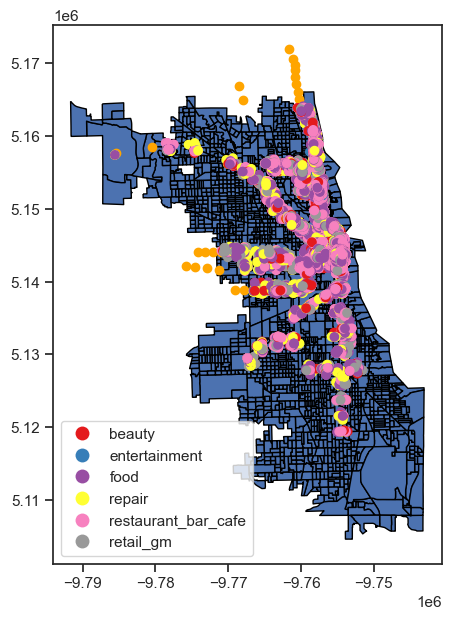

In [313]:
chi_proj =chi.to_crs({"init": "EPSG:3857"})
x =alt_cta.to_crs({"init": "EPSG:3857"})

f, ax = plt.subplots(figsize=[12,7])


chi_proj[chi_proj["community"].notna()].plot(ax=ax, edgecolor='black')
x.plot(ax=ax, color='orange')
#alt_cta.plot(ax=ax, color='red')
biz_inbuffer[biz_inbuffer["biz_cats_new"] != "unknown"].plot(ax=ax, column="biz_cats_new", cmap="Set1", legend=True)

In [314]:
# I'm now just interested in restaurants/cafes for biz and violent type crimes

biz_cnts = biz_inbuffer[biz_inbuffer["biz_cats_new"] == 'restaurant_bar_cafe'].groupby("cta_index")["business_text"].count()
crime_cnts = crime_inbuffer[crime_inbuffer["crime_cat"].isin(['Violent Crime', 'Homicide', 'Sexual Assault'])].groupby("cta_index")["Case Number"].count()

#if want to see by type of biz or crime, would need to add to group by  and make maps for the separate categories.

In [315]:
cta_buffer_summary = cta_proj.merge(biz_cnts,how="left", left_index= True, right_on="cta_index").reset_index(drop=True) \
.merge(crime_cnts, how="left", on="cta_index") \
.rename(columns={"business_text":"biz_cnts_inBuffer", "Case Number":"crime_cnts_inBuffer"}).fillna(0)

print(type(cta_buffer_summary))
cta_buffer_summary.head()

<class 'geopandas.geodataframe.GeoDataFrame'>


,cta_index,MAP_ID,cta_L_cnt,geometry,ctaGeom,biz_cnts_inBuffer,crime_cnts_inBuffer
0,0,40010,1,POINT (-9771270.015 5141653.139),POINT (-87.77681 41.87085),0.0,59.0
1,1,40020,1,POINT (-9774204.842 5144044.864),POINT (-87.80318 41.88685),0.0,0.0
2,2,40030,1,POINT (-9765547.303 5143830.142),POINT (-87.72540 41.88541),5.0,286.0
3,3,40040,4,POINT (-9755343.313 5142830.014),POINT (-87.63374 41.87872),296.0,308.0
4,4,40050,2,POINT (-9760887.358 5168128.852),POINT (-87.68354 42.04771),0.0,0.0


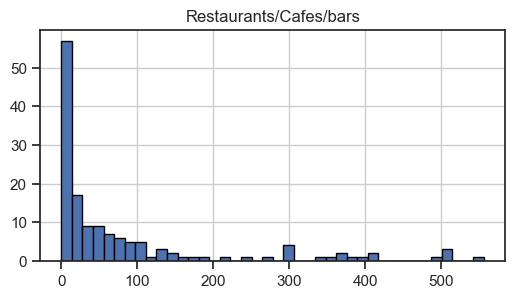

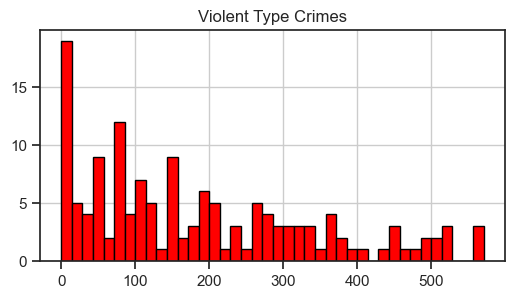

In [316]:
cta_buffer_summary["biz_cnts_inBuffer"].hist(bins=40,edgecolor='black',figsize=[6,3])
plt.title('Restaurants/Cafes/bars')
plt.show()
cta_buffer_summary["crime_cnts_inBuffer"].hist(bins=40,edgecolor='black',figsize=[6,3],color='red')
plt.title('Violent Type Crimes')
plt.show()

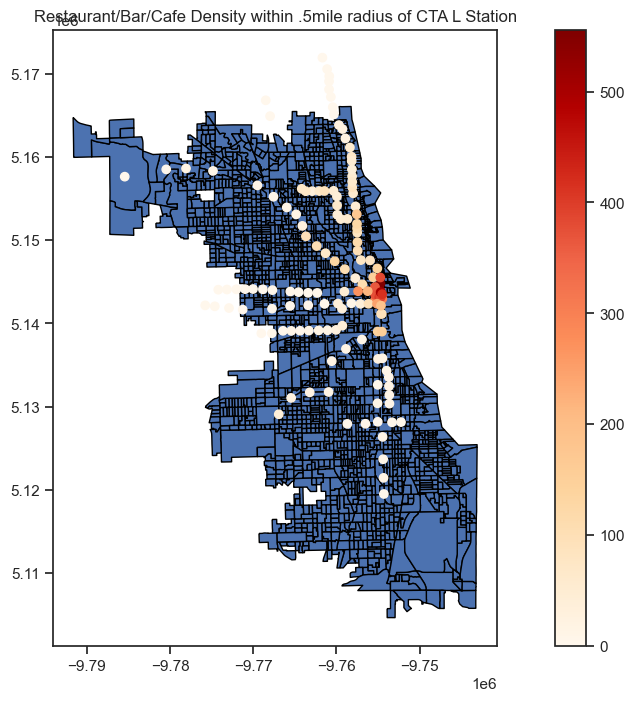

In [317]:
#downtown/loop inherently has more business. Let's play around with different biz count cutoffs to see the 
#true relationship of how businesses are dispersed in other parts of the city
biz_cnt_cutoff = 1000

f, ax = plt.subplots(figsize=[15,8])


chi_proj[chi_proj["community"].notna()].plot(ax=ax, edgecolor='black')
cta_buffer_summary[cta_buffer_summary["biz_cnts_inBuffer"] < biz_cnt_cutoff] \
.plot(ax=ax, column="biz_cnts_inBuffer", cmap="OrRd", legend=True)
plt.title("Restaurant/Bar/Cafe Density within .5mile radius of CTA L Station")
plt.show()

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6



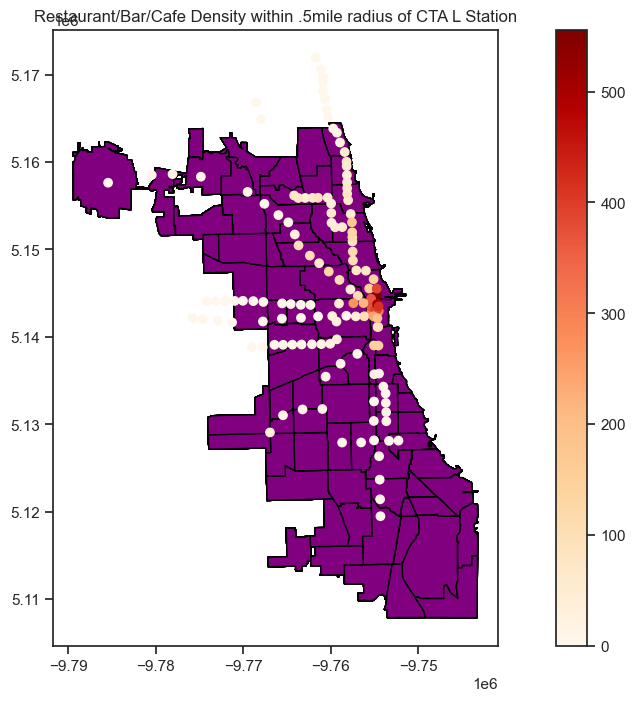

In [318]:

z=chi
z["geometry"] = z["cmntyGeom"]
chiCmnty_proj = z.to_crs({"init": "EPSG:3857"})

chiCmnty_proj = chiCmnty_proj[chiCmnty_proj["community"].notna()]

f, ax = plt.subplots(figsize=[15,8])

chiCmnty_proj.plot(ax=ax, edgecolor='black', color='purple')
cta_buffer_summary[cta_buffer_summary["biz_cnts_inBuffer"] < biz_cnt_cutoff] \
.plot(ax=ax, column="biz_cnts_inBuffer", cmap="OrRd", legend=True)
plt.title("Restaurant/Bar/Cafe Density within .5mile radius of CTA L Station")
plt.show()

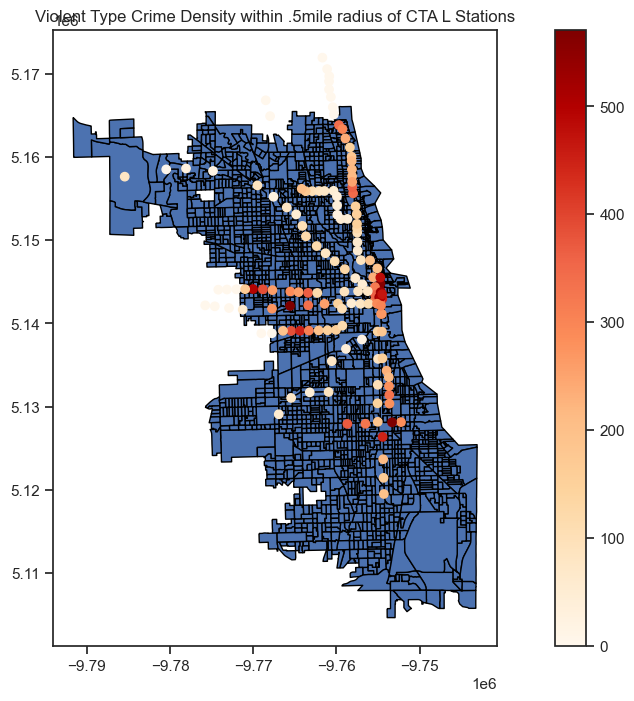

In [319]:
crime_cnt_cutoff = 3000

f, ax = plt.subplots(figsize=[15,8])

chi_proj[chi_proj["community"].notna()].plot(ax=ax, edgecolor='black')

cta_buffer_summary[cta_buffer_summary["crime_cnts_inBuffer"] < crime_cnt_cutoff] \
.plot(ax=ax, column="crime_cnts_inBuffer", cmap="OrRd", legend=True)

plt.title("Violent Type Crime Density within .5mile radius of CTA L Stations")
plt.show()

The areas around the L going northwest are amongst the safest L stations (this is the blue line),
and southwest (orange line)

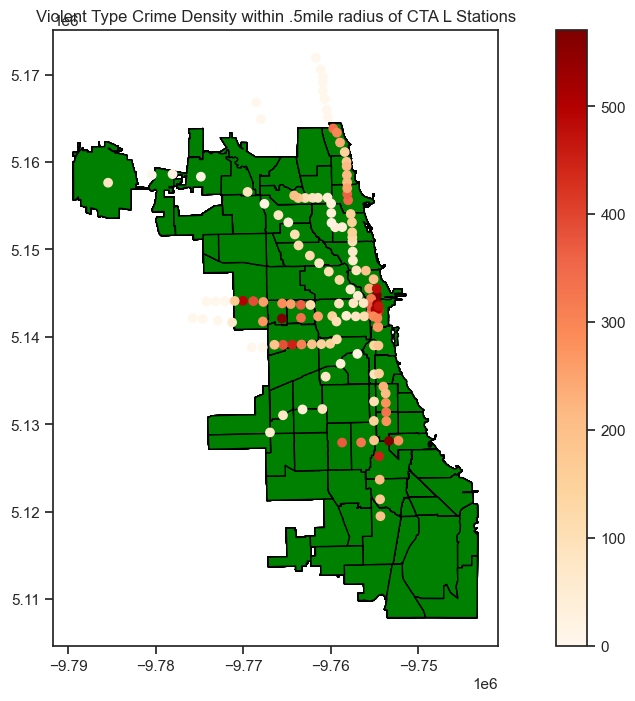

In [320]:
crime_cnt_cutoff = 3000

f, ax = plt.subplots(figsize=[15,8])

chiCmnty_proj.plot(ax=ax, edgecolor='black', color='green')

cta_buffer_summary[cta_buffer_summary["crime_cnts_inBuffer"] < crime_cnt_cutoff] \
.plot(ax=ax, column="crime_cnts_inBuffer", cmap="OrRd", legend=True)

plt.title("Violent Type Crime Density within .5mile radius of CTA L Stations")
plt.show()

## Next Steps

In the future, adding demographic information will give even more insights into the different areas of the city and how resources are distributed.

After adding in this layer of information, information about housing prices will be the pinnacle of understanding what areas I would/could live in


In [322]:
pd.DataFrame(chi3).to_csv("~/Documents/Data_Science_Projects/Chicago_Tool/Chi_Map_Data_1.csv", index=False)

In [323]:
len(chi3)

2332

# Summary

restuarants/bar density has correlation with thefts and L line/station counts; also with other types of food establishments, which make sense. DO A SCATTER PLOT TO REALLY SEE THIS RELATIONSHIP

plot made me wonder about arrest rates, so I added this as a variable and re-did corr plot

didn't see any strong correlations with arrest rate and other vars
moved on to look at distribution of our variables

by crime type, variability of crimes committed is alot
for arrest rates, most blocks (half) have close to 0 arrest rate, but there are some outlier blocks that get more arrests
for business licenses, we see that most block groups have very few, but there are some with an overinflated amount
moved on to trying to see if there's any spatial patterns for our data for putting in on a map. Where are the places that have lots of businesses, particularly places to go out?

as expected, lot of high volume restaurant/bar blocks downtown and near north side
I also expected lots of theft to be in this area, which there was and also heading northwest, seemingly up milwaukee to bucktown/wicker park area. I expected to see relatively high arrest rates here, but didn't
I saw a lot of violent crimes in downtown area, which I didn't expect. But also saw a lot on West and South side
unexpectedly, seems to be a relatively consistent smathering of beauty business throughout the city
These data made me wonder about neighborhoods. The things we see in this data are they just block to block, or can we say something overall about neighborhoods/community areas?

Uptown has top 3 violent crime arrest rate, but is in bottom 50% for violent crimes
same for Gage Park (it seems to be right in middle of the pack for violent crimes, but has second highest arrest rate)
Near south side has high amount of vc and high arrest rate
This raises questions about policing...which communities have higher effort? Or maybe there's more community assistance with making an arrest?
the expected west and south side communities have highest number of homicides (although why are numbers on bar chart decimals...because it's the mean for the community area)
Switching gears: I think living close to an el is important. What can I dig up about crime and stuff to do within a certain radius of an el station

L's on the north side have a higher concentration of businesses around them than south and west side stations
Total crime counts around L stations seem pretty mid-range. and this goes for all sides of the city. Lines going northwest and southwest seem to have low range of crime counts. Wonder how these maps would change if we looked at specific crimes rather than all together. *side note: may want to make a stacked crime bar chart by community to be able to compare totals to their segments

### just playing around with maps / plots

/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  """
/opt/anaconda3/envs/ls_geo_env/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  """


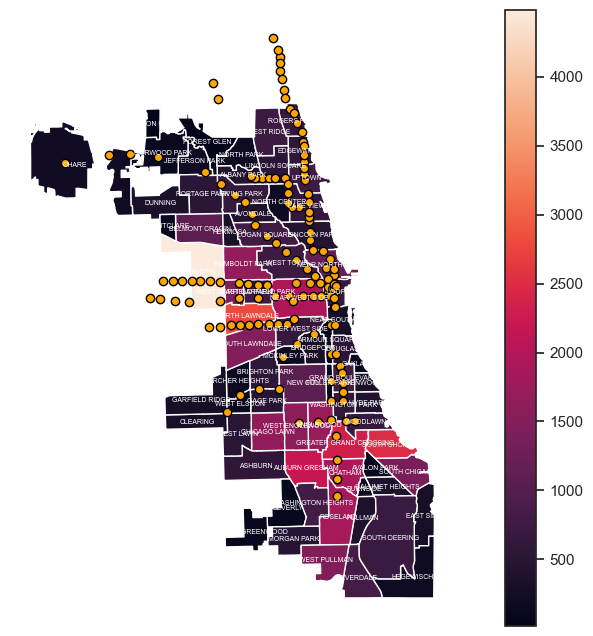

In [216]:
f, ax = plt.subplots(figsize=[13,8])

chi3_byCmnty_sub[["geometry", "Violent Crime"]].plot(ax=ax, column='Violent Crime',legend=True)

for x, y, label in zip(cmnty_sf.geometry.centroid.x, cmnty_sf.geometry.centroid.y, cmnty_sf['community']):
    ax.text(x, y, label, fontsize=5, ha='center', va='center', color='white')
  

alt_cta.plot(ax=ax, color='orange', edgecolor='black')
#alt_cta.plot(ax=ax, color='red')


#plt.title('Violent Crime')
plt.axis('off')
plt.show()


#zx = cmnty_sf.plot(column='community', figsize=[12,8], edgecolor='black')


In [222]:
chi3.columns

Index(['community', 'geometry', 'cmntyGeom', 'blkGrpGeom', 'ALAND', 'AWATER',
       'geometry_str', 'cta_L_cnt', 'beauty', 'entertainment', 'food',
       'repair', 'restaurant_bar_cafe', 'retail_gm', 'unknown',
       'blkGrpGeom_str', 'Homicide', 'Narcotics', 'Other', 'Sexual Assault',
       'Theft', 'Violent Crime', 'H_Arrests', 'N_Arrests', 'O_Arrests',
       'SA_Arrests', 'T_Arrests', 'VC_Arrests', 'H_ArrstRate', 'N_ArrstRate',
       'O_ArrstRate', 'SA_ArrstRate', 'T_ArrstRate', 'VC_ArrstRate'],
      dtype='object')

In [339]:
chi3_byCmnty_sub.head()

,community,geometry,restaurant_bar_cafe,beauty,Theft,Violent Crime,Homicide,T_ArrstRate,VC_ArrstRate,H_ArrstRate
0,ALBANY PARK,"POLYGON ((-87.70404 41.97355, -87.70403 41.973...",111.0,18.0,453.0,441.0,5.0,0.024841,0.147688,0.16000
1,ARCHER HEIGHTS,"POLYGON ((-87.71437 41.82604, -87.71436 41.825...",32.0,12.0,191.0,162.0,4.0,0.018712,0.084897,0.20000
2,ARMOUR SQUARE,"POLYGON ((-87.62917 41.84556, -87.62947 41.845...",122.0,8.0,248.0,112.0,3.0,0.056860,0.200909,0.40000
3,ASHBURN,"POLYGON ((-87.71255 41.75734, -87.71252 41.757...",69.0,32.0,601.0,587.0,2.0,0.023666,0.086843,0.02381
4,AUBURN GRESHAM,"POLYGON ((-87.63990 41.75615, -87.63990 41.755...",49.0,36.0,1398.0,2187.0,36.0,0.044652,0.175069,0.15000


In [345]:
import plotly.express as px 

fig = px.choropleth(data_frame=chi3_byCmnty_sub, 
                        geojson=chi3_byCmnty_sub.geometry, 
                        locations=chi3_byCmnty_sub.index, 
                        color="Homicide",
                    hover_name="community",
                    color_continuous_scale="magma",
                        #template='plotly_dark'
                        )
fig.update_geos(fitbounds="locations", visible=False)
#fig.update_layout(legend=dict( orientation="h", yanchor="bottom",xanchor="right",font=dict(size=5)))
#fig.update(layout_coloraxis_showscale=False) # this works
fig.update_traces({'colorbar_orientation':'h'})#, selector=dict(type='heatmap'))

fig.show()

In [338]:
#for i in pltlst:

ByComm = pd.DataFrame(chi3.groupby("community")["Violent Crime"].mean().sort_values()).reset_index()
ByComm.head()

fig = px.bar(ByComm, y='community', x='Violent Crime', orientation='h')
fig.show()

In [332]:
ByComm.head()

,community,Violent Crime
0,EDISON PARK,1.214286
1,FOREST GLEN,2.500000
2,MOUNT GREENWOOD,2.514286
3,NORWOOD PARK,3.868421
4,NORTH CENTER,5.000000


In [349]:
z = 'https://www.realtor.com/realestateandhomes-detail/11315-S-Avenue-G-2_Chicago_IL_60617_M90771-17034'

def make_clickable(val):
    return '<a href="{}">{}</a>'.format(val,val)
#temp_tbl.style.format({z: make_clickable})
print(z)

https://www.realtor.com/realestateandhomes-detail/11315-S-Avenue-G-2_Chicago_IL_60617_M90771-17034
